# Experiments Information

### Data

Dataset split: shuffle by seed=42, then split

* Source Activities: Downstairs, Jogging, Upstairs, Walking

    * Train: 80%
    * Val: 10%
    * Test: 10%

* Target Activites: Sitting, Standing

    * Train: 80%
    * Val: 10%
    * Test: 10%

# Imports

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pickle
import tensorflow as tf
import warnings

from copy import deepcopy
from google.colab import drive
from sklearn.metrics import precision_recall_fscore_support, classification_report, confusion_matrix, roc_auc_score
from tabulate import tabulate

In [ ]:
# Supress warnings
warnings.resetwarnings()
warnings.simplefilter('ignore', pd.core.common.SettingWithCopyWarning)
# tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
warnings.filterwarnings('ignore')

# Load Data

In [ ]:
if not os.path.exists("drive/"):
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# # Download data to runtime environment
if not os.path.exists("activity_clusters_df/"):
    ! gdown --folder https://drive.google.com/drive/folders/1CqsUGqC6-8EIY7wOEL58LgpRYxRcnR_4?usp=sharing

Retrieving folder list
Processing file 138srRsR00ALdY5C1C09tLFO_bWGMOkoZ activity_Downstairs_df
Processing file 1QJTINMLihyyjljNEk7DBRQyMjGXVjPcf activity_Jogging_df
Processing file 1U_lzf-yOBC96IupG-9wS324Lyu78u916 activity_Sitting_df
Processing file 1wZitN2BWyzh_dW2OGSIy03YxVdKI3P07 activity_Standing_df
Processing file 1C5GpQ7RhX_t_h-9XGV9x7I3Leufs5_Sl activity_Upstairs_df
Processing file 1_hPbQ1MtEqqEI3KQ7ttIYGIdYH7yi36d activity_Walking_df
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=138srRsR00ALdY5C1C09tLFO_bWGMOkoZ
To: /content/activity_clusters_df/activity_Downstairs_df
100% 6.45M/6.45M [00:00<00:00, 118MB/s]
Downloading...
From: https://drive.google.com/uc?id=1QJTINMLihyyjljNEk7DBRQyMjGXVjPcf
To: /content/activity_clusters_df/activity_Jogging_df
100% 5.84M/5.84M [00:00<00:00, 155MB/s]
Downloading...
From: https://drive.google.com/uc?id=1U_lzf-yOBC96IupG-9wS324Lyu78u916
To

In [ ]:
import shutil
if not os.path.exists("activity_clusters_df/"):
    os.makedirs("activity_clusters_df/")
    for a in ["Downstairs", "Jogging", "Sitting", "Standing", "Upstairs", "Walking"]:
        shutil.move("activity_%s_df"%(a), "activity_clusters_df/activity_%s_df"%(a))

In [ ]:
# Load files
a = {}
a.update({"downstairs": pd.read_csv("activity_clusters_df/activity_Downstairs_df")})
a.update({"jogging": pd.read_csv("activity_clusters_df/activity_Jogging_df")})
a.update({"sitting": pd.read_csv("activity_clusters_df/activity_Sitting_df")})
a.update({"standing": pd.read_csv("activity_clusters_df/activity_Standing_df")})
a.update({"upstairs": pd.read_csv("activity_clusters_df/activity_Upstairs_df")})
a.update({"walking": pd.read_csv("activity_clusters_df/activity_Walking_df")})
a["downstairs"]

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,396,397,398,399,400,401,402,403,404,label
0,0,0.347781,-0.138535,-0.193372,0.344895,-0.361490,-0.022368,-0.487038,-0.209246,0.295830,...,8.401310,11.536848,7.377326,7.413861,10.035742,23.009137,12.744466,6.154779,14.102396,Downstairs
1,1,-0.021646,-1.033963,-0.129877,0.378807,-0.290780,0.655156,-0.215018,-0.731639,0.127712,...,0.741876,4.400749,4.572016,2.830738,7.404858,12.970116,18.842095,6.662716,3.388563,Downstairs
2,2,0.224398,-0.479101,-0.061331,-0.514456,0.240994,0.315312,-1.046951,-0.044014,0.425707,...,1.313861,0.541320,2.435998,3.155475,7.391318,13.092170,19.106387,8.995701,2.401558,Downstairs
3,3,-0.958202,-0.675359,0.605370,-0.126269,0.044014,0.168840,-0.848528,0.099572,-0.632788,...,1.602404,2.465977,4.372747,3.890775,4.875640,16.151132,17.317576,6.441824,5.470999,Downstairs
4,4,-0.088028,-0.605370,-0.137814,-0.577952,0.523115,-1.020254,-0.762665,0.691233,-0.064217,...,3.811060,4.668090,4.262479,3.276219,5.800673,21.300805,10.898992,7.144370,1.583750,Downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1723,951,0.251817,-0.032469,-0.101737,0.016595,-0.176777,-0.327578,-0.005772,0.149358,-0.404061,...,1.483657,1.377412,2.938841,7.620979,16.244419,3.833034,4.081372,1.490163,0.927737,Downstairs
1724,952,-0.550533,0.193372,0.105344,-0.157295,0.025254,-0.264804,0.083698,-0.351389,0.271298,...,0.889991,1.543232,1.624482,3.305709,19.087942,3.713675,1.819241,0.337514,1.048459,Downstairs
1725,953,-0.365820,0.132763,-0.097408,-0.065660,0.069989,-0.346338,-0.209967,-0.198423,0.171726,...,0.865340,1.073513,3.153473,7.171036,13.203347,5.925594,2.963233,3.437277,1.862654,Downstairs
1726,954,-0.450961,-0.481987,0.406947,0.160181,-0.171004,-0.019482,-0.295830,0.146472,-0.428593,...,0.579823,3.242935,5.769628,12.175428,10.336841,1.909687,1.943557,1.214420,1.752679,Downstairs


In [ ]:
# View shapes
sorter = []
for k in a:
    sorter.append([k, a[k].shape])
sorter = sorted(sorter, key = lambda x: x[1], reverse=True)
for i in sorter:
    print(i[0] + ":", i[1])

downstairs: (1728, 407)
jogging: (1557, 407)
upstairs: (571, 407)
walking: (456, 407)
sitting: (264, 407)
standing: (198, 407)


# Preprocess Data

In [ ]:
# Drop column "Unnamed: 0", was previous index
for k in a:
    a[k].drop("Unnamed: 0", axis=1, inplace=True)
a["downstairs"]

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
0,0.347781,-0.138535,-0.193372,0.344895,-0.361490,-0.022368,-0.487038,-0.209246,0.295830,-0.163067,...,8.401310,11.536848,7.377326,7.413861,10.035742,23.009137,12.744466,6.154779,14.102396,Downstairs
1,-0.021646,-1.033963,-0.129877,0.378807,-0.290780,0.655156,-0.215018,-0.731639,0.127712,-0.431479,...,0.741876,4.400749,4.572016,2.830738,7.404858,12.970116,18.842095,6.662716,3.388563,Downstairs
2,0.224398,-0.479101,-0.061331,-0.514456,0.240994,0.315312,-1.046951,-0.044014,0.425707,-0.481266,...,1.313861,0.541320,2.435998,3.155475,7.391318,13.092170,19.106387,8.995701,2.401558,Downstairs
3,-0.958202,-0.675359,0.605370,-0.126269,0.044014,0.168840,-0.848528,0.099572,-0.632788,0.500026,...,1.602404,2.465977,4.372747,3.890775,4.875640,16.151132,17.317576,6.441824,5.470999,Downstairs
4,-0.088028,-0.605370,-0.137814,-0.577952,0.523115,-1.020254,-0.762665,0.691233,-0.064217,-0.305210,...,3.811060,4.668090,4.262479,3.276219,5.800673,21.300805,10.898992,7.144370,1.583750,Downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1723,0.251817,-0.032469,-0.101737,0.016595,-0.176777,-0.327578,-0.005772,0.149358,-0.404061,-0.229449,...,1.483657,1.377412,2.938841,7.620979,16.244419,3.833034,4.081372,1.490163,0.927737,Downstairs
1724,-0.550533,0.193372,0.105344,-0.157295,0.025254,-0.264804,0.083698,-0.351389,0.271298,-0.367984,...,0.889991,1.543232,1.624482,3.305709,19.087942,3.713675,1.819241,0.337514,1.048459,Downstairs
1725,-0.365820,0.132763,-0.097408,-0.065660,0.069989,-0.346338,-0.209967,-0.198423,0.171726,-0.202752,...,0.865340,1.073513,3.153473,7.171036,13.203347,5.925594,2.963233,3.437277,1.862654,Downstairs
1726,-0.450961,-0.481987,0.406947,0.160181,-0.171004,-0.019482,-0.295830,0.146472,-0.428593,0.221512,...,0.579823,3.242935,5.769628,12.175428,10.336841,1.909687,1.943557,1.214420,1.752679,Downstairs


## Encode

In [ ]:
# Numeric encode tasks
label_map = {}
for i, row in enumerate(sorter):
    label_map.update({row[0].capitalize(): i})
label_values = list(label_map.keys())
print()
print(label_values)
for k in a:
    a[k].replace({"label": label_map}, inplace=True)
a["downstairs"]


['Downstairs', 'Jogging', 'Upstairs', 'Walking', 'Sitting', 'Standing']


,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
0,0.347781,-0.138535,-0.193372,0.344895,-0.361490,-0.022368,-0.487038,-0.209246,0.295830,-0.163067,...,8.401310,11.536848,7.377326,7.413861,10.035742,23.009137,12.744466,6.154779,14.102396,0
1,-0.021646,-1.033963,-0.129877,0.378807,-0.290780,0.655156,-0.215018,-0.731639,0.127712,-0.431479,...,0.741876,4.400749,4.572016,2.830738,7.404858,12.970116,18.842095,6.662716,3.388563,0
2,0.224398,-0.479101,-0.061331,-0.514456,0.240994,0.315312,-1.046951,-0.044014,0.425707,-0.481266,...,1.313861,0.541320,2.435998,3.155475,7.391318,13.092170,19.106387,8.995701,2.401558,0
3,-0.958202,-0.675359,0.605370,-0.126269,0.044014,0.168840,-0.848528,0.099572,-0.632788,0.500026,...,1.602404,2.465977,4.372747,3.890775,4.875640,16.151132,17.317576,6.441824,5.470999,0
4,-0.088028,-0.605370,-0.137814,-0.577952,0.523115,-1.020254,-0.762665,0.691233,-0.064217,-0.305210,...,3.811060,4.668090,4.262479,3.276219,5.800673,21.300805,10.898992,7.144370,1.583750,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1723,0.251817,-0.032469,-0.101737,0.016595,-0.176777,-0.327578,-0.005772,0.149358,-0.404061,-0.229449,...,1.483657,1.377412,2.938841,7.620979,16.244419,3.833034,4.081372,1.490163,0.927737,0
1724,-0.550533,0.193372,0.105344,-0.157295,0.025254,-0.264804,0.083698,-0.351389,0.271298,-0.367984,...,0.889991,1.543232,1.624482,3.305709,19.087942,3.713675,1.819241,0.337514,1.048459,0
1725,-0.365820,0.132763,-0.097408,-0.065660,0.069989,-0.346338,-0.209967,-0.198423,0.171726,-0.202752,...,0.865340,1.073513,3.153473,7.171036,13.203347,5.925594,2.963233,3.437277,1.862654,0
1726,-0.450961,-0.481987,0.406947,0.160181,-0.171004,-0.019482,-0.295830,0.146472,-0.428593,0.221512,...,0.579823,3.242935,5.769628,12.175428,10.336841,1.909687,1.943557,1.214420,1.752679,0


## Split train/val/test

In [ ]:
# Shuffle and split datasets
for k in a:
    a[k] = a[k].sample(frac=1, random_state=42)

    train = a[k].sample(frac=0.8, random_state=42)
    
    test = a[k].drop(train.index)
    val = test.sample(frac=0.5, random_state=42)
    test = test.drop(val.index)

    a[k] = {"train": train, "val": val, "test": test}


a["downstairs"]["test"]

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1201,-1.389681,-0.768437,-0.632788,-0.442303,-0.624852,-0.223677,-0.881719,-1.101066,-0.594547,-0.691233,...,6.377698,23.097966,34.745855,31.002063,13.502014,5.365942,17.302269,9.897225,10.672325,0
964,0.865845,-0.771324,-0.486316,-0.751842,1.155903,0.254703,-0.773488,-0.743905,0.111117,0.835540,...,2.825395,2.573991,6.367593,4.187489,1.899719,9.260373,33.115722,5.929711,1.529781,0
413,0.233057,0.585888,-0.114003,0.445189,-0.013709,-0.196258,0.400453,-0.437252,0.228727,0.401175,...,4.028925,4.821610,2.289383,3.686963,5.740266,9.941857,17.784360,4.817460,4.924605,0
548,0.701334,0.724424,0.196980,0.379529,-0.204195,0.367984,1.343503,0.251095,0.776374,0.277070,...,2.443603,3.435704,6.043240,8.907956,29.000425,12.809702,2.070378,4.846413,3.773253,0
1671,-0.103901,-0.143586,-0.041128,0.320363,-0.104623,0.194094,0.411998,0.190486,-0.306653,0.492810,...,5.289757,1.809001,1.676475,1.680219,0.266505,3.511785,1.919212,10.520469,17.055988,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,-0.013709,0.075040,-0.072875,0.105344,0.101737,-0.309540,-0.088028,-0.120497,-0.254703,-0.608256,...,4.129190,3.974917,5.113546,5.618137,14.070138,21.073451,2.994010,3.932900,2.417648,0
699,-0.054837,0.114003,-0.370870,-0.655878,-0.521672,-0.691233,0.522393,-0.850693,-0.839870,0.239550,...,0.936173,1.673157,1.239003,1.715976,3.375701,23.138617,4.755795,2.156915,1.692749,0
459,0.588775,0.146472,0.555584,0.547647,0.210689,0.909137,0.614750,0.654435,0.795856,1.135700,...,0.863662,1.869787,1.517108,3.072035,18.275238,3.599495,1.361696,1.953886,1.474018,0
871,0.381693,0.442303,0.093800,0.386744,-0.298717,-0.088749,0.432923,-0.317477,-0.411998,0.356440,...,2.072231,2.458438,1.006014,19.762199,2.622684,2.806861,4.014831,5.073175,3.007891,0


In [ ]:
# Combine Source and target activites
data = {"source": {"train": None, "val": None, "test": None}, "target": {"train": None, "val": None, "test": None}, "comb": {"train": None, "val": None, "test": None}}

data["source"]["train"] = pd.concat([a["downstairs"]["train"], a["jogging"]["train"], a["upstairs"]["train"], a["walking"]["train"]], axis=0, ignore_index=True)
data["source"]["val"] = pd.concat([a["downstairs"]["val"], a["jogging"]["val"], a["upstairs"]["val"], a["walking"]["val"]], axis=0, ignore_index=True)
data["source"]["test"] = pd.concat([a["downstairs"]["test"], a["jogging"]["test"], a["upstairs"]["test"], a["walking"]["test"]], axis=0, ignore_index=True)

data["target"]["train"] = pd.concat([a["sitting"]["train"], a["standing"]["train"]], axis=0, ignore_index=True)
data["target"]["val"] = pd.concat([a["sitting"]["val"], a["standing"]["val"]], axis=0, ignore_index=True)
data["target"]["test"] = pd.concat([a["sitting"]["test"], a["standing"]["test"]], axis=0, ignore_index=True)

data["comb"]["train"] = pd.concat([a["downstairs"]["train"], a["jogging"]["train"], a["upstairs"]["train"], a["walking"]["train"], a["sitting"]["train"], a["standing"]["train"]], axis=0, ignore_index=True)
data["comb"]["val"] = pd.concat([a["downstairs"]["val"], a["jogging"]["val"], a["upstairs"]["val"], a["walking"]["val"], a["sitting"]["val"], a["standing"]["val"]], axis=0, ignore_index=True)
data["comb"]["test"] = pd.concat([a["downstairs"]["test"], a["jogging"]["test"], a["upstairs"]["test"], a["walking"]["test"], a["sitting"]["test"], a["standing"]["test"]], axis=0, ignore_index=True)

In [ ]:
# View shapes
for k1 in data:
    print(k1, " =============================================")
    for k2 in data[k1]:
        print(k2, " ", data[k1][k2].shape)
    print()

source  =============================================
train   (3450, 406)
val   (432, 406)
test   (430, 406)

target  =============================================
train   (369, 406)
val   (46, 406)
test   (47, 406)

comb  =============================================
train   (3819, 406)
val   (478, 406)
test   (477, 406)



In [ ]:
# Shuffle
for k1 in data:
    for k2 in data[k1]:
        data[k1][k2] = data[k1][k2].sample(frac=1, random_state=42)
data["target"]["test"]

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
27,-0.945214,-0.948100,-0.928619,-0.940163,-0.939442,-0.945214,-0.929340,-0.933670,-0.939442,-0.934391,...,0.144262,0.079154,0.183547,0.185953,0.248063,0.131990,0.129237,0.111134,0.268732,5
39,-0.196980,-0.207803,-0.212854,-0.229449,-0.194094,-0.191207,-0.204917,-0.204917,-0.190486,-0.199144,...,0.133540,0.189815,0.238591,0.214635,0.008080,0.150123,0.168663,0.110836,0.122620,5
26,0.229449,0.232335,0.232335,0.226563,0.226563,0.232335,0.229449,0.226563,0.229449,0.229449,...,1.880219,0.190019,1.755064,0.175249,1.665210,0.192309,1.553323,0.177241,1.521029,4
43,-0.124826,-0.134206,-0.146472,-0.137092,-0.126269,-0.132041,-0.137092,-0.134206,-0.137092,-0.137092,...,0.076726,0.027835,0.039110,0.048211,0.136854,0.148528,0.138518,0.112994,0.071880,5
24,0.134206,0.124826,0.129877,0.128434,0.121218,0.128434,0.126269,0.128434,0.132763,0.128434,...,0.264158,0.062952,0.312728,0.223765,0.172969,0.291265,0.212392,0.275663,0.195294,4
36,-0.199866,-0.235221,-0.218626,-0.202031,-0.202752,-0.207803,-0.215740,-0.207803,-0.204917,-0.240994,...,0.492353,0.190280,0.242284,0.358666,0.345047,0.272525,0.167364,0.151443,0.342169,5
12,0.832654,0.832654,0.829768,0.826882,0.829768,0.823996,0.823996,0.832654,0.826882,0.826882,...,0.036258,0.029791,0.052171,0.133756,0.044947,0.080735,0.040027,0.059444,0.110168,4
19,0.933670,0.931505,0.936556,0.931505,0.931505,0.931505,0.933670,0.928619,0.931505,0.936556,...,0.080441,0.018828,0.047001,0.026592,0.021779,0.043337,0.025553,0.010653,0.031541,4
4,0.210689,0.202031,0.207803,0.204917,0.213575,0.210689,0.213575,0.207803,0.210689,0.215740,...,0.031883,0.102569,0.087867,0.028671,0.018775,0.062245,0.033283,0.104598,0.064072,4
25,0.093800,0.116889,0.184714,0.069268,0.142143,0.131320,0.127712,0.107509,0.119054,0.149358,...,0.129379,0.268797,0.337266,0.205890,0.409909,0.236516,0.464918,0.268131,0.268319,4


## Split Sample and Label

In [ ]:
# Split
def split_x_y(df, img_rows, img_cols):

    # Flat data
    x = df[df.columns[:-1]]
    y = df[["label"]]

    # Image data
    shaped = x.to_numpy(copy=True)
    shaped = np.reshape(shaped, (shaped.shape[0], img_rows, img_cols))

    return{"df": df, "x": x, "y": y, "x_shaped": shaped}

img_rows = 27
img_cols = 15

for k1 in data:
    for k2 in data[k1]:
        data[k1][k2] = split_x_y(data[k1][k2], img_rows, img_cols)

In [ ]:
# View shapes
def view_data_shapes(data):
    for k1 in data:
        print(k1, "=============================================")
        for k2 in data[k1]:
            print(k2, "---------------------------------------------")
            for k3 in data[k1][k2]:
                print(k3, " ", data[k1][k2][k3].shape)
            print()
        print()

view_data_shapes(data)

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (369, 406)
x   (369, 405)
y   (369, 1)
x_shaped   (369, 27, 15)

val ---------------------------------------------
df   (46, 406)
x   (46, 405)
y   (46, 1)
x_shaped   (46, 27, 15)

test ---------------------------------------------
df   (47, 406)
x   (47, 405)
y   (47, 1)
x_shaped   (47, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3819, 406)
x   (3819, 405)
y   (3819, 1)
x_shaped   (3819, 27

In [ ]:
del a
del train, test, val
del sorter

In [ ]:
# Write to .csv files
# dir = ""
# for k1 in data:
#     for k2 in data[k1]:
#         for k3 in data[k1][k2]:
#             print(k1, k2, k3)
#             if k3 == "x_shaped":
#                 with open("%s%s_%s_%s.pickle"%(dir, k1, k2, k3), "wb") as file:
#                     pickle.dump(data[k1][k2][k3], file)
#             else:
#                 data[k1][k2][k3].to_csv("%s%s_%s_%s.csv"%(dir, k1, k2, k3), header=True, index=False)

# Models

## Single Model Handler

In [ ]:
class ModelHandler():
    
    def __init__(self, name, labels_to_values_map, checkpoint_path="checkpoints/", checkpoint_file_name="cp.ckpt"):
        self.model_name = name
        self.labels_to_values_map = labels_to_values_map
        self.checkpoint_path = checkpoint_path
        self.checkpoint_file_name = checkpoint_file_name
        self.cp_paths = {}
        self.cp_callbacks = {}
        self.hist = {}
            
    # Build model ==============================================================
    def build_model(self, model_type, input_shape, n_labels=6, learning_rate=0.001, metrics=["accuracy"], drop=False):
        if model_type not in ["dense", "conv"]:
            print(model_type, "is an invalid model type. Please enter a value in [\"dense\", \"conv\"].")
        self.model_type = model_type
        self.input_shape = input_shape
        self.n_labels = n_labels
        self.learning_rate = learning_rate
        self.metrics = metrics
        self.drop = drop
        
        # Build dense model
        if model_type == "dense":
            self.model = tf.keras.Sequential([tf.keras.layers.Input(shape=input_shape)])
            if not drop:
                self.model.add(tf.keras.layers.Dense(405, activation="relu"))
            self.model.add(tf.keras.layers.Dense(202, activation="relu"))
            if not drop:
                self.model.add(tf.keras.layers.Dense(101, activation="relu"))

        # Build cnn model
        elif model_type == "conv":
            self.model = tf.keras.Sequential([tf.keras.layers.Input(shape=input_shape)])
            self.model.add(tf.keras.layers.Conv2D(32, kernel_size=(1, 1),
                                                  activation='relu',
                                                  input_shape=input_shape
                                                  ))
            if not drop:
                self.model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
            self.model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
            if not drop:
                self.model.add(tf.keras.layers.Dropout(0.25))
            self.model.add(tf.keras.layers.Flatten())
            self.model.add(tf.keras.layers.Dense(128, activation='relu'))
            if not drop:
                self.model.add(tf.keras.layers.Dropout(0.5))

        self.model.add(tf.keras.layers.Dense(n_labels, activation="softmax"))
        self.model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                           loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
                           metrics=metrics
                           )
    
    def build_transfer_model(self, train_layers):
        for layer in self.model.layers[:-train_layers]:
            layer.trainable = False
        self.model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=self.learning_rate),
                           loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
                           metrics=self.metrics
                           )
        
    # Train model ==============================================================

    # Checkpointing ------------------------------------------------------------
    def setup_checkpointing(self, experiment_level):

        # Paths
        if experiment_level not in self.cp_paths:
            self.cp_paths.update({experiment_level: "%s%s"%(self.checkpoint_path, self.checkpoint_file_name)})
        if not os.path.exists(self.cp_paths[experiment_level]):
            os.makedirs(self.cp_paths[experiment_level])

        # Callbacks
        if experiment_level not in self.cp_callbacks:
            self.cp_callbacks.update({experiment_level: tf.keras.callbacks.ModelCheckpoint(filepath=self.cp_paths[experiment_level],
                                                                                           save_weights_only=True,
                                                                                           verbose=1, 
                                                                                           save_freq="epoch",
                                                                                           save_best_only=True
                                                                                           )
                                      })
    
    # Training -----------------------------------------------------------------
    def train_model(self, experiment_level, train_x, train_y, val_x, val_y, epochs=10):

        # Setup checkpoints
        self.setup_checkpointing(experiment_level)

        # Update history dictionary
        if experiment_level not in self.hist:
            self.hist.update({experiment_level: None})

        # Train
        self.hist[experiment_level] = self.model.fit(train_x, train_y, 
                                                     validation_data=(val_x, val_y), 
                                                     epochs=epochs, 
                                                     callbacks=[self.cp_callbacks[experiment_level]]
                                                     )
        
        # Load best
        self.model.load_weights(self.cp_paths[experiment_level])

    # Evaluate =================================================================
    def evaluate(self, test_x, test_y, verbose=True):
        preds =  self.model.predict(test_x)
        preds_select = np.apply_along_axis(np.argmax, 1, preds)
        true = [y[0] for y in test_y.values]

        loss, acc = self.model.evaluate(test_x, test_y, verbose=2)
        scores = precision_recall_fscore_support(true, preds_select, average='macro')
        pre = scores[0]
        re = scores[1]
        f1 = scores[2]
        auc = np.nan
        try:
            auc = roc_auc_score(true, preds, multi_class="ovo")
        except:
            auc = np.nan

        report = classification_report(true, preds_select)
        cm = confusion_matrix(true, preds_select, labels=list(self.labels_to_values_map.values()))

        if verbose:
            print("\nModel Results:")
            print("Loss: %f\nAccuracy: %f\nPrecision: %f\nRecall: %f\nF1: %f\nAUC: %f\n"%(loss, acc, pre, re, f1, auc))
            print("Classification Report:")
            print(report)
            print("\nConfusion Matrix:")
            print(tabulate([[k] + list(cm[i]) for i, k in enumerate(list(self.labels_to_values_map.keys()))], 
                        ["Activity"] + list(label_map.keys()), 
                        tablefmt="grid")
            )

        return loss, acc, pre, re, f1, auc, preds, report, cm

## Model Archetype Handler

In [ ]:
class ModelArchetypeHandler():

    def __init__(self, archetype_name, experiment_name, labels_to_values_map, save_dir="", checkpoint_path="checkpoints/", checkpoint_file_name="cp.ckpt"):
        self.archetype_name = archetype_name
        self.experiment_name = experiment_name
        self.labels_to_values_map = labels_to_values_map
        self.save_dir = save_dir
        self.checkpoint_path = save_dir + checkpoint_path
        self.checkpoint_file_name = checkpoint_file_name
        self.hist = {}
        self.tracker = None
        self.names = ["naive", "initial_target", "transfer_target", "initial_comb", "transfer_comb"]

    # Build and Train Models ===================================================
    def run_experiment(self, input_shape, train_layers, 
                       data, x_key,
                       n_labels=6, learning_rate=0.001, metrics=["accuracy"], drop=False, 
                       epochs=10, n_runs=5, 
                       verbose=True
                       ):
        
        tracker = []
        for run in range(n_runs):
            for n in self.names:
                if n not in self.hist:
                    self.hist.update({n: {}})
                if run not in self.hist[n]:
                    self.hist[n].update({run: None})

            # Naive model
            level = "naive"
            header = "\n\nRun %d, %s, %s ===="%(run, self.archetype_name, level)
            print(header.ljust(85, "="))
            self.n_model = ModelHandler(name="%s_%s_%d"%(self.archetype_name, level, run), 
                                        labels_to_values_map=self.labels_to_values_map, 
                                        checkpoint_path="%s%s/%s/%d/"%(self.checkpoint_path, self.archetype_name, level, run), 
                                        checkpoint_file_name=self.checkpoint_file_name
                                        )
            self.n_model.build_model(self.archetype_name, input_shape, n_labels, learning_rate, metrics, drop)
            self.n_model.train_model(level, 
                                     data["comb"]["train"][x_key], data["comb"]["train"]["y"], 
                                     data["comb"]["val"][x_key], data["comb"]["val"]["y"], 
                                     epochs*2
                                     )
            self.hist[level][run] = self.n_model.hist[level]
            for test in ["source", "target", "comb"]:
                loss, acc, pre, re, f1, auc, preds, report, cm = self.n_model.evaluate(data[test]["test"][x_key], 
                                                                                       data[test]["test"]["y"], 
                                                                                       verbose=verbose
                                                                                       )
                tracker.append([self.archetype_name, level, run, test, loss, acc, pre, re, f1, auc, report, cm, preds, self.n_model.hist[level]])

            # Initial target model
            level = "initial_target"
            header = "\n\nRun %d, %s, %s ===="%(run, self.archetype_name, level)
            print(header.ljust(85, "="))
            self.t_target_model = ModelHandler(name="%s_%s_%d"%(self.archetype_name, level, run),
                                               labels_to_values_map=self.labels_to_values_map, 
                                               checkpoint_path="%s%s/%s/%d/"%(self.checkpoint_path, self.archetype_name, level, run), 
                                               checkpoint_file_name=self.checkpoint_file_name
                                               )
            self.t_target_model.build_model(self.archetype_name, input_shape, n_labels, learning_rate, metrics, drop)
            self.t_target_model.train_model(level, 
                                            data["comb"]["train"][x_key], data["comb"]["train"]["y"], 
                                            data["comb"]["val"][x_key], data["comb"]["val"]["y"], 
                                            epochs
                                            )
            self.hist[level][run] = self.t_target_model.hist[level]
            for test in ["source", "target", "comb"]:
                loss, acc, pre, re, f1, auc, preds, report, cm = self.t_target_model.evaluate(data[test]["test"][x_key], 
                                                                                              data[test]["test"]["y"], 
                                                                                              verbose=verbose
                                                                                              )
                tracker.append([self.archetype_name, level, run, test, loss, acc, pre, re, f1, auc, report, cm, preds, self.t_target_model.hist[level]])

            # Transfer target model
            level = "transfer_target"
            header = "\n\nRun %d, %s, %s ===="%(run, self.archetype_name, level)
            print(header.ljust(85, "="))
            # self.t_target_model = ModelHandler(name="%s_%s_%d"%(self.archetype_name, level, run),
            #                                    labels_to_values_map=self.labels_to_values_map, 
            #                                    checkpoint_path="%s%s/%s/%d/"%(self.checkpoint_path, self.archetype_name, level, run), 
            #                                    checkpoint_file_name=self.checkpoint_file_name
            #                                    )
            self.t_target_model.build_transfer_model(train_layers)
            self.t_target_model.train_model(level, 
                                            data["comb"]["train"][x_key], data["comb"]["train"]["y"], 
                                            data["comb"]["val"][x_key], data["comb"]["val"]["y"], 
                                            epochs
                                            )
            self.hist[level][run] = self.t_target_model.hist[level]
            for test in ["source", "target", "comb"]:
                loss, acc, pre, re, f1, auc, preds, report, cm = self.t_target_model.evaluate(data[test]["test"][x_key], 
                                                                                              data[test]["test"]["y"], 
                                                                                              verbose=verbose
                                                                                              )
                tracker.append([self.archetype_name, level, run, test, loss, acc, pre, re, f1, auc, report, cm, preds, self.t_target_model.hist[level]])
                
            # Initial comb model
            level = "initial_comb"
            header = "\n\nRun %d, %s, %s ===="%(run, self.archetype_name, level)
            print(header.ljust(85, "="))
            self.t_comb_model = ModelHandler(name="%s_%s_%d"%(self.archetype_name, level, run),
                                             labels_to_values_map=self.labels_to_values_map, 
                                             checkpoint_path="%s%s/%s/%d/"%(self.checkpoint_path, self.archetype_name, level, run), 
                                             checkpoint_file_name=self.checkpoint_file_name
                                             )
            self.t_comb_model.build_model(self.archetype_name, input_shape, n_labels, learning_rate, metrics, drop)
            self.t_comb_model.train_model(level, 
                                         data["comb"]["train"][x_key], data["comb"]["train"]["y"], 
                                         data["comb"]["val"][x_key], data["comb"]["val"]["y"], 
                                         epochs
                                         )
            self.hist[level][run] = self.t_comb_model.hist[level]
            for test in ["source", "target", "comb"]:
                loss, acc, pre, re, f1, auc, preds, report, cm = self.t_comb_model.evaluate(data[test]["test"][x_key], 
                                                                                             data[test]["test"]["y"], 
                                                                                             verbose=verbose
                                                                                             )
                tracker.append([self.archetype_name, level, run, test, loss, acc, pre, re, f1, auc, report, cm, preds, self.t_comb_model.hist[level]])

            # Transfer comb model
            level = "transfer_comb"
            header = "\n\nRun %d, %s, %s ===="%(run, self.archetype_name, level)
            print(header.ljust(85, "="))
            # self.t_comb_model = ModelHandler(name="%s_%s_%d"%(self.archetype_name, level, run),
            #                                  labels_to_values_map=self.labels_to_values_map, 
            #                                  checkpoint_path="%s%s/%s/%d/"%(self.checkpoint_path, self.archetype_name, level, run), 
            #                                  checkpoint_file_name=self.checkpoint_file_name
            #                                  )
            self.t_comb_model.build_transfer_model(train_layers)
            self.t_comb_model.train_model(level, 
                                         data["comb"]["train"][x_key], data["comb"]["train"]["y"], 
                                         data["comb"]["val"][x_key], data["comb"]["val"]["y"], 
                                         epochs
                                         )
            self.hist[level][run] = self.t_comb_model.hist[level]
            for test in ["source", "target", "comb"]:
                loss, acc, pre, re, f1, auc, preds, report, cm = self.t_comb_model.evaluate(data[test]["test"][x_key], 
                                                                                             data[test]["test"]["y"], 
                                                                                             verbose=verbose
                                                                                             )
                tracker.append([self.archetype_name, level, run, test, loss, acc, pre, re, f1, auc, report, cm, preds, self.t_comb_model.hist[level]])

        # Get run averages -----------------------------------------------------

        # Set up averages collecter
        averages = {}
        for level in list(self.names):
            averages.update({level: {}})
            for test in ["source", "target", "comb"]:
                averages[level].update({test: [0, 0, 0, 0, 0, 0]})
        
        # Get scores
        for row in tracker:
            for i in range(4, 10):
                averages[row[1]][row[3]][i-4] += row[i]
        
        # Add average scores to tracker
        for level in list(self.names):
            for test in ["source", "target", "comb"]:
                avg = [self.archetype_name, level, -1, test, 
                       averages[level][test][0]/n_runs, 
                       averages[level][test][1]/n_runs, 
                       averages[level][test][2]/n_runs, 
                       averages[level][test][3]/n_runs, 
                       averages[level][test][4]/n_runs, 
                       averages[level][test][5]/n_runs, 
                       np.nan, np.nan, np.nan, np.nan
                       ]
                tracker.append(avg)

        # To dataframe
        self.tracker = sorted(tracker, key=lambda x: (x[0], x[1], x[2], x[3]))
        self.tracker = pd.DataFrame(self.tracker, columns=["model_archetype", "model_type", 
                                                 "run", "test_level", "loss", 
                                                 "accuracy", "precision", 
                                                 "recall", "f1", "auc", "report", "confusion_matrix", 
                                                 "predictions", "history"
                                                 ])
        self.tracker["exp_name"] = [self.experiment_name] * self.tracker.shape[0]
        # self.tracker.to_csv(self.save_dir + "trackers/" + self.experiment_name + "_" + self.archetype_name + ".csv", index=False)
        
        return self.tracker

## Dual Model Archetype Handler

In [ ]:
class DualModelArchetypeHandler():

    def __init__(self, experiment_name, labels_to_values_map, save_dir="", checkpoint_path="checkpoints/", checkpoint_file_name="cp.ckpt"):
        self.experiment_name = experiment_name
        self.labels_to_values_map = labels_to_values_map
        self.save_dir = save_dir
        self.checkpoint_path = checkpoint_path
        self.checkpoint_file_name = checkpoint_file_name

        self.dense_handler = ModelArchetypeHandler("dense", self.experiment_name, self.labels_to_values_map, self.save_dir, self.checkpoint_path, self.checkpoint_file_name)
        self.conv_handler = ModelArchetypeHandler("conv", self.experiment_name, self.labels_to_values_map, self.save_dir, self.checkpoint_path, self.checkpoint_file_name)
        
    def run_experiment(self, dense_input_shape, conv_input_shape, 
                       dense_train_layers, conv_train_layers, 
                       data, n_labels=6, learning_rate=0.001, metrics=["accuracy"], drop=False, 
                       epochs=10, n_runs=5, 
                       verbose=True
                       ):
        
        self.dense_handler.run_experiment(input_shape=dense_input_shape, train_layers=dense_train_layers, 
                       data=data, x_key="x",
                       n_labels=n_labels, learning_rate=learning_rate, metrics=metrics, drop=drop, 
                       epochs=epochs, n_runs=n_runs, 
                       verbose=verbose)
        
        self.conv_handler.run_experiment(input_shape=conv_input_shape, train_layers=conv_train_layers, 
                       data=data, x_key="x_shaped",
                       n_labels=n_labels, learning_rate=learning_rate, metrics=metrics, drop=drop, 
                       epochs=epochs, n_runs=n_runs, 
                       verbose=verbose)
        
        self.dual_tracker = pd.concat([self.dense_handler.tracker, self.conv_handler.tracker])
        self.dual_tracker.to_csv(self.save_dir + "trackers/" + self.experiment_name + "_dual" + ".csv", index=False)
        
        with open(self.save_dir + "histories/" + exp_name + "_dense.pickle", "wb") as file:
            pickle.dump(self.dense_handler.hist, file)
        with open(self.save_dir + "histories/" + exp_name + "_conv.pickle", "wb") as file:
            pickle.dump(self.conv_handler.hist, file)

        return self.dual_tracker

# Plotting

## History

In [ ]:
def plot_histories(dual_handler, n_runs, epochs, save=False, save_dir="", save_name=""):
    fig, ax = plt.subplots(6, 4, figsize=(15, 20))
    # col 0: accuracy
    # col 1: val accuracy
    # col 2: loss
    # col 3: val loss
    # row 0: dense naive
    # row 1: dense transfer target val
    # row 2: dense transfer comb val
    # row 3: conv naive
    # row 4: conv transfer target val
    # row 5: conv transfer comb val

    # Subplot labels ===========================================================
    for i, architecture in enumerate(["Dense", "Conv."]):
        for k, model in enumerate(["Naive", "Transfer Target", "Transfer Combined"]):
            for j, metric in enumerate(["Accuracy", "Val. Accuracy", "Loss", "Val. Loss"]):
                row = k
                if i > 0:
                    row += 3
                ax[row][j].set_xlabel("Epochs")
                ax[row][j].set_ylabel(metric)
                ax[row][j].set_title(" ".join([architecture, model, metric]))

    # Subplots =================================================================
    labels = []
    avgs = {"accuracy": None, 
            "val_accuracy": None, 
            "loss": None, 
            "val_loss": None
            }
    for run in range(n_runs):
        labels.append("Run %d"%(run + 1))
        for j, score in enumerate(["accuracy", "val_accuracy", "loss", "val_loss"]):

            # Dense
            ax[0][j].plot(dual_handler.dense_handler.hist["naive"][run].history[score])
            ax[1][j].plot(dual_handler.dense_handler.hist["initial_target"][run].history[score] + dual_handler.dense_handler.hist["transfer_target"][run].history[score])
            ax[2][j].plot(dual_handler.dense_handler.hist["initial_comb"][run].history[score] + dual_handler.dense_handler.hist["transfer_comb"][run].history[score])

            # Conv
            ax[3][j].plot(dual_handler.conv_handler.hist["naive"][run].history[score])
            ax[4][j].plot(dual_handler.conv_handler.hist["initial_target"][run].history[score] + dual_handler.conv_handler.hist["transfer_target"][run].history[score])
            ax[5][j].plot(dual_handler.conv_handler.hist["initial_comb"][run].history[score] + dual_handler.conv_handler.hist["transfer_comb"][run].history[score])

    # Plot limits ==============================================================

    # Get values ---------------------------------------------------------------
    loss = [None, None]
    for i in range(6):
        for j in range(2):

            # Loss min
            if loss[0] is None:
                loss[0] = ax[i][j+2].get_ylim()[0]
            elif loss[0] > ax[i][j+2].get_ylim()[0]:
                loss[0] = ax[i][j+2].get_ylim()[0]

            # Loss max
            if loss[1] is None:
                loss[1] = ax[i][j+2].get_ylim()[1]
            elif loss[1] < ax[i][j+2].get_ylim()[1]:
                loss[1] = ax[i][j+2].get_ylim()[1]
                
    # Set values ---------------------------------------------------------------
    for i in range(6):
        for j in range(2):
            ax[i][j].set_ylim((0, 1))
            ax[i][j+2].set_ylim(loss)
    plt.setp(ax, xlim=(0, epochs*2-1))

    # Plot =====================================================================
    fig.legend(labels=labels, loc="upper right")
    plt.tight_layout()
    plt.subplots_adjust(right=0.9)
    if save:
        plt.savefig(save_dir + save_name)
    plt.plot()

## Tracker Results

In [ ]:
def plot_scores(tracker, save=False, save_dir="", save_name=""):
    fig, ax = plt.subplots(2, 2, figsize=(15, 10))

    metrics = [["precision", "recall"], ["accuracy", "f1"]]
    types = ["naive", "initial_target", "transfer_target", "initial_comb", "transfer_comb"]
    test_sets = ["target", "comb"]
    archs = ["dense", "conv"]
    colors = [["xkcd:light orange", "xkcd:orange"], ["xkcd:sky blue", "xkcd:deep sky blue"]]
    label_keys = []

    for a in archs:
        for t in test_sets:
            label_keys.append(a + " " + t)

    # Get scores
    for i in range(2):
        for j in range(2):
            m = metrics[i][j]
            df = tracker.loc[tracker["run"] == -1]

            w = 0.2
            x_ticks = {0: np.arange(len(types))}
            c = 0
            for k, a in enumerate(archs):
                for l, t in enumerate(test_sets):
                    tmp = df.loc[(df["test_level"] == t) & (df["model_archetype"] == a)]
                    vals = tmp[m].tolist()
                    vals = [vals[2], vals[1], vals[4], vals[0], vals[3]]
                    idx = label_keys.index("%s %s"%(a, t))
                    ax[i][j].bar(x_ticks[c], vals, width=w, color=colors[k][l], label=label_keys[idx])
                    c += 1
                    x_ticks.update({c: [x + w for x in x_ticks[c-1]]})

            ax[i][j].set_xlabel("Model Type")
            ax[i][j].set_ylabel("Score")
            ax[i][j].set_title(m.capitalize())

    plt.setp(ax, xticks=[x + w for x in range(len(types))], xticklabels=types)
    plt.tight_layout()
    plt.subplots_adjust(right=0.9)
    plt.legend(labels=label_keys, loc="upper right")
    if save:
        plt.savefig(save_dir + save_name)
    plt.show()

# Experiments

## Global Hyperparameters

In [ ]:
lables_to_values_map = deepcopy(label_map)
labels_list = list(lables_to_values_map.keys())

# File Handling
save_dir = "/content/drive/MyDrive/AI in healthcare and Wearables/Results/"      # Mica dir
# save_dir =      # Suman dir
# save_dir =      # Jwook dir
# save_dir =      # Bijesh dir
checkpoint_path = "checkpoints/exp_"
cp_file = "checkpoint.ckpt"
hist_plot_dir = save_dir + "hist_plots/"
tracker_bar_dir = save_dir + "tracker_bar_plots/"

# Model hyperparmeters
n_labels = 6
input_shape_dense = (405, )
input_shape_conv = (img_rows, img_cols, 1)
epochs = 10
n_runs = 5

# History
tracker_global = {}

## Experiment 1 - Baseline

Initial run with no changes to the base models we're running.

### Hyperparameters

In [ ]:
exp_name = "001_baseline"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.001
dense_train_layers = 2
conv_train_layers = 3
drop = False

### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
117/120 [============================>.] - ETA: 0s - loss: 0.8510 - accuracy: 0.7975
Epoch 1: val_loss improved from inf to 0.33128, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_001_baseline/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 4s 13ms/step - loss: 0.8435 - accuracy: 0.7992 - val_loss: 0.3313 - val_accuracy: 0.8682
Epoch 2/20
119/120 [============================>.] - ETA: 0s - loss: 0.3187 - accuracy: 0.8868
Epoch 2: val_loss improved from 0.33128 to 0.32406, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_001_baseline/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 1s 4ms/step - loss: 0.3184 - accuracy: 0.8869 - val_loss: 0.3241 - val_accuracy: 0.8828
Epoch 3/20
109/120 [==========================>...] - ETA: 0s - loss: 0.2482 - accura

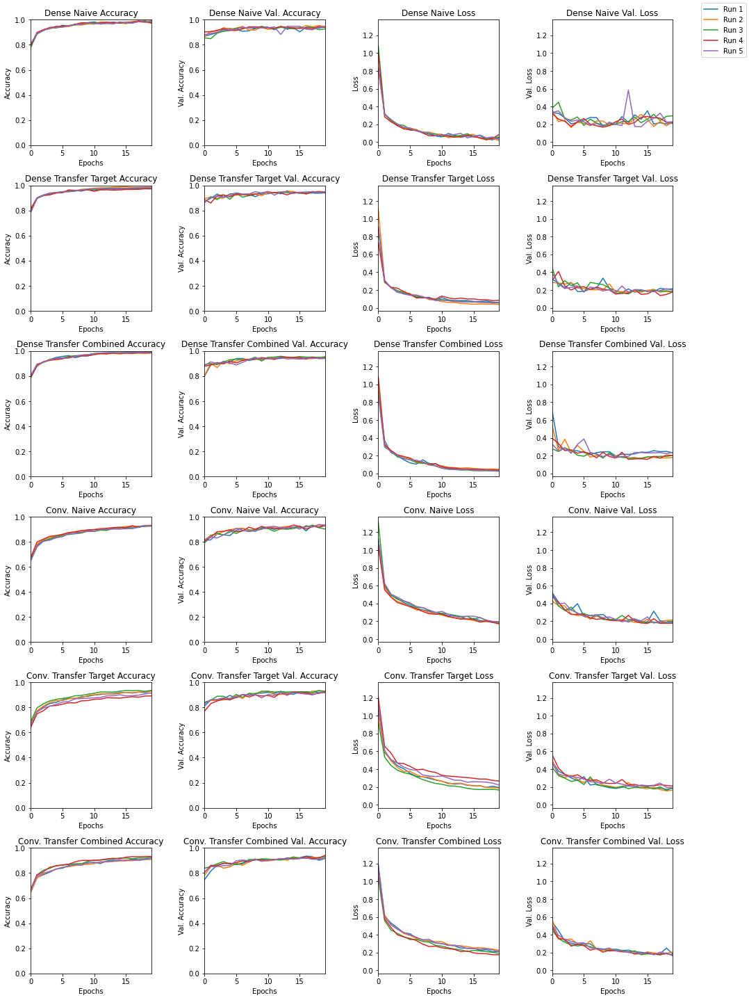

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

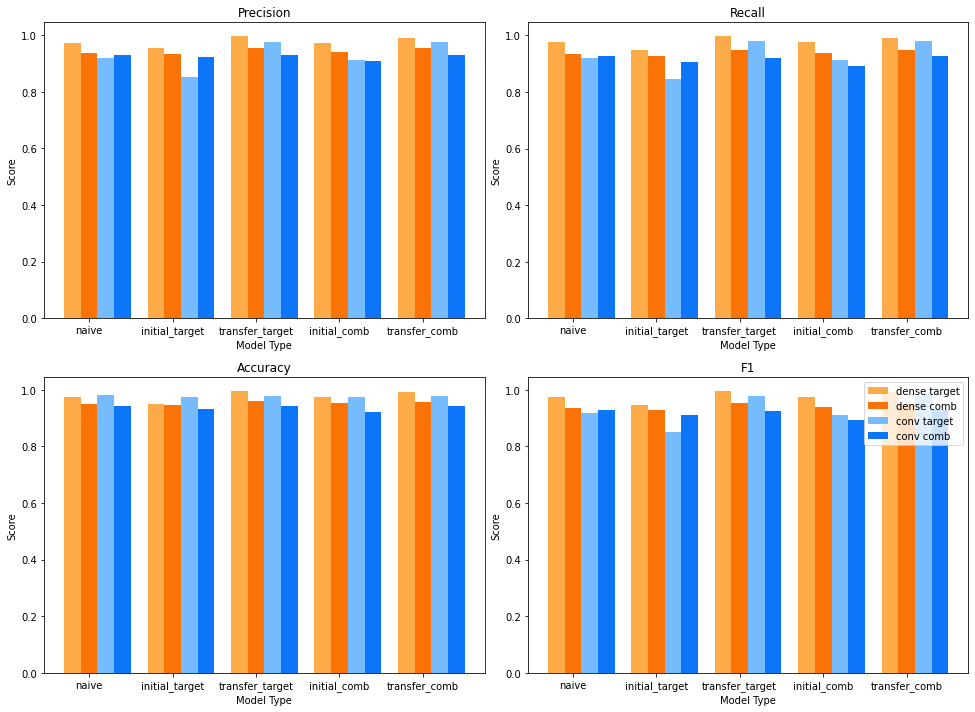

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 2 - Learning Rate

The previous model trains too fast. Lower the learning rate.

### Hyperparameters

In [ ]:
exp_name = "002_drop_learning_rate"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.00001
dense_train_layers = 2
conv_train_layers = 3
drop = False

### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
114/120 [===========================>..] - ETA: 0s - loss: 4.4878 - accuracy: 0.2415
Epoch 1: val_loss improved from inf to 1.98973, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_002_drop_learning_rate/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 2s 12ms/step - loss: 4.3882 - accuracy: 0.2490 - val_loss: 1.9897 - val_accuracy: 0.4268
Epoch 2/20
119/120 [============================>.] - ETA: 0s - loss: 1.5052 - accuracy: 0.5397
Epoch 2: val_loss improved from 1.98973 to 1.20309, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_002_drop_learning_rate/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 0s 4ms/step - loss: 1.5046 - accuracy: 0.5394 - val_loss: 1.2031 - val_accuracy: 0.6172
Epoch 3/20
111/120 [==========================>...] - ETA: 0s - l

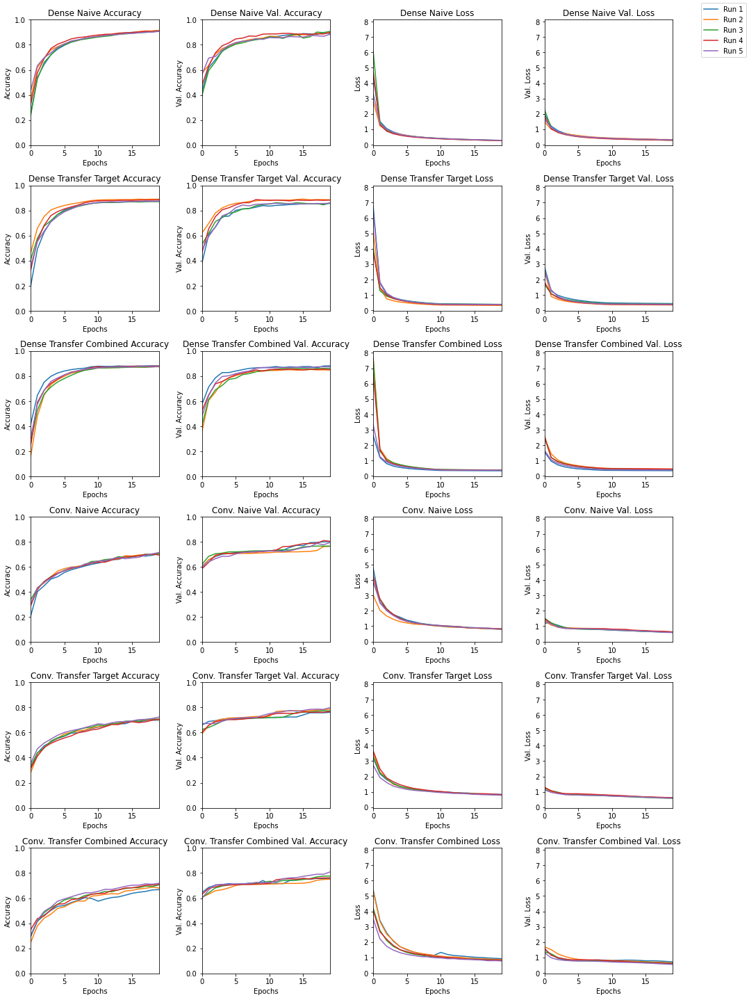

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                         )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

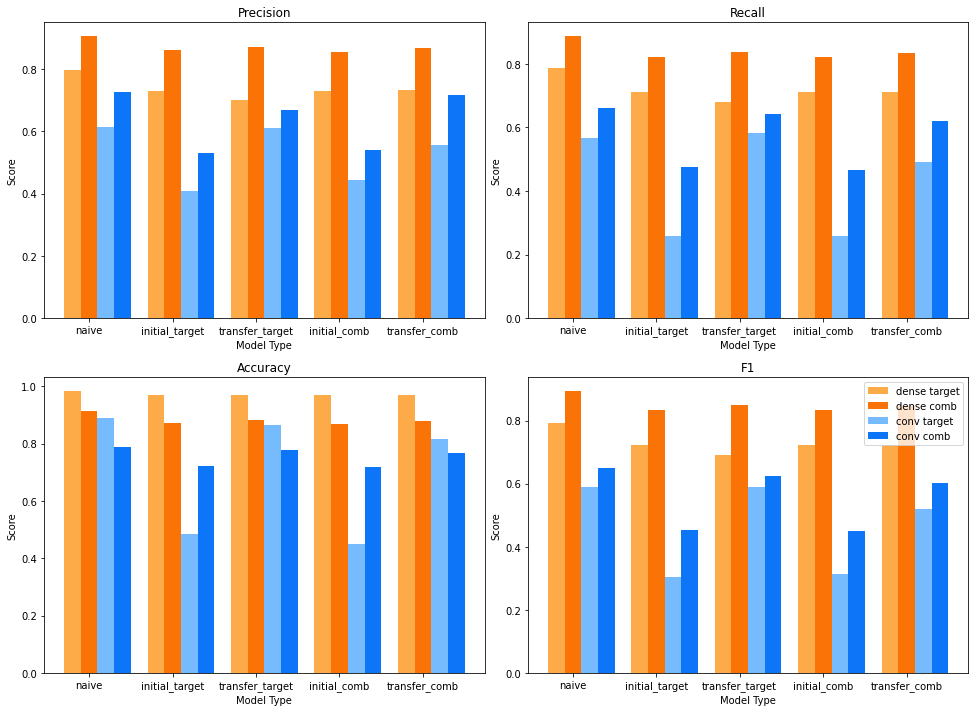

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 3 - Drop Layers

Drop layers to furthur reduce training time.

### Hyperparameters

In [ ]:
exp_name = "003_drop_layers"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
113/120 [===========================>..] - ETA: 0s - loss: 1.0342 - accuracy: 0.8045
Epoch 1: val_loss improved from inf to 0.31755, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_003_drop_layers/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 2s 13ms/step - loss: 0.9997 - accuracy: 0.8094 - val_loss: 0.3176 - val_accuracy: 0.8828
Epoch 2/20
101/120 [========================>.....] - ETA: 0s - loss: 0.3615 - accuracy: 0.8951
Epoch 2: val_loss did not improve from 0.31755
120/120 [==============================] - 0s 3ms/step - loss: 0.3738 - accuracy: 0.8926 - val_loss: 0.4934 - val_accuracy: 0.8598
Epoch 3/20
118/120 [============================>.] - ETA: 0s - loss: 0.3152 - accuracy: 0.9023
Epoch 3: val_loss did not improve from 0.31755
120/120 [==============================] - 0s 3ms/step - loss: 0.3139 - accuracy:

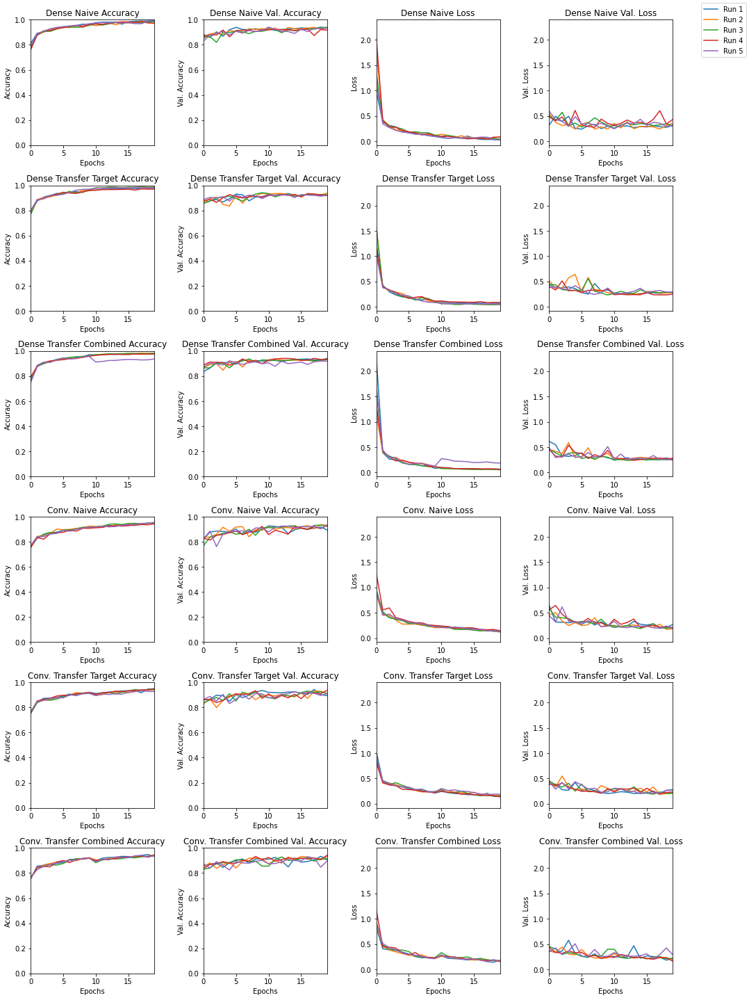

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

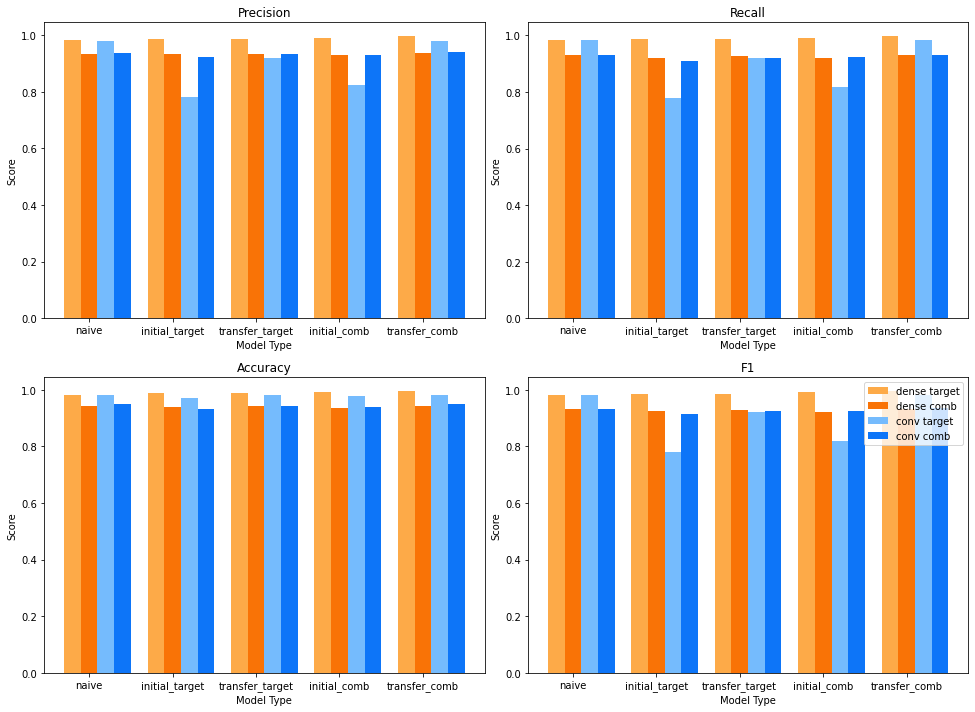

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 4 - Drop Layers and Drop Learning Rate

Drop both the layers and the learning rate.

### Hyperparameters

In [ ]:
exp_name = "004_drop_layers_drop_learning_rate"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
117/120 [============================>.] - ETA: 0s - loss: 24.7344 - accuracy: 0.2845
Epoch 1: val_loss improved from inf to 20.07545, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_004_drop_layers_drop_learning_rate/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 2s 12ms/step - loss: 24.6294 - accuracy: 0.2836 - val_loss: 20.0754 - val_accuracy: 0.2448
Epoch 2/20
109/120 [==========================>...] - ETA: 0s - loss: 16.9794 - accuracy: 0.2199
Epoch 2: val_loss improved from 20.07545 to 13.57228, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_004_drop_layers_drop_learning_rate/dense/naive/0/checkpoint.ckpt
120/120 [==============================] - 0s 4ms/step - loss: 16.8137 - accuracy: 0.2218 - val_loss: 13.5723 - val_accuracy: 0.2573
Epoch 3/20
118/120 [============

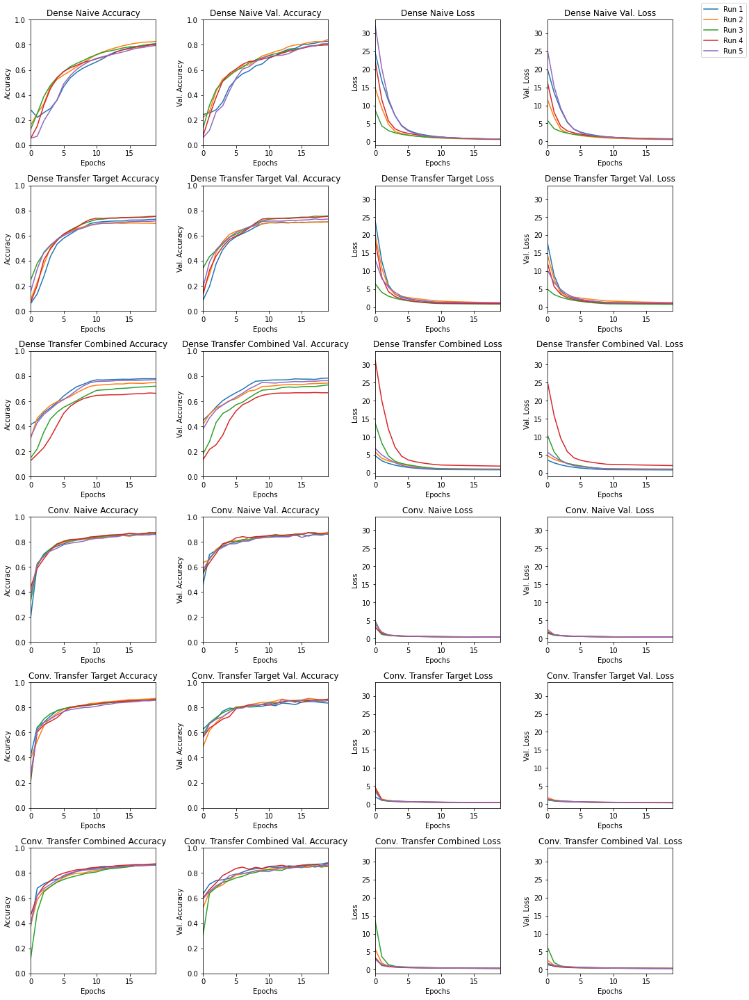

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

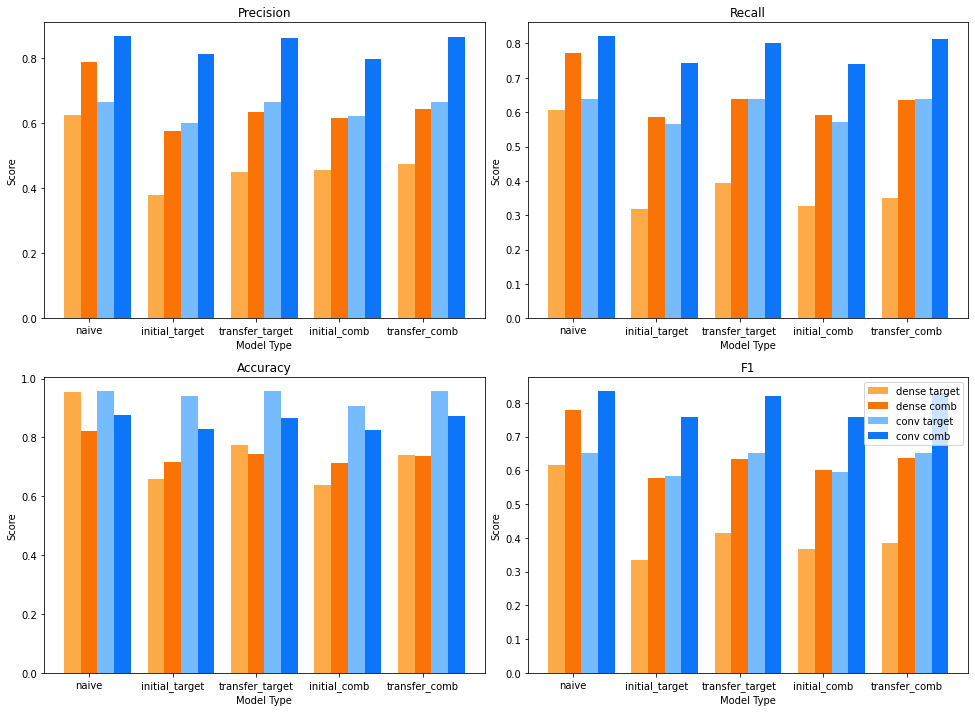

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 5 - Reduce Data

Reduce training data.

### Hyperparameters

In [ ]:
exp_name = "005_reduce_data"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = 0.5

# Training
learning_rate = 0.001
dense_train_layers = 2
conv_train_layers = 3
drop = False

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            df.append(tmp.sample(frac=keep, random_state=42))
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (1724, 406)
x   (1724, 405)
y   (1724, 1)
x_shaped   (1724, 27, 15)

val ---------------------------------------------
df   (215, 406)
x   (215, 405)
y   (215, 1)
x_shaped   (215, 27, 15)

test ---------------------------------------------
df   (214, 406)
x   (214, 405)
y   (214, 1)
x_shaped   (214, 27, 15)


target =============================================
train ---------------------------------------------
df   (185, 406)
x   (185, 405)
y   (185, 1)
x_shaped   (185, 27, 15)

val ---------------------------------------------
df   (23, 406)
x   (23, 405)
y   (23, 1)
x_shaped   (23, 27, 15)

test ---------------------------------------------
df   (24, 406)
x   (24, 405)
y   (24, 1)
x_shaped   (24, 27, 15)


comb =============================================
train ---------------------------------------------
df   (1909, 406)
x   (1909, 405)
y   (1909, 1)
x_shaped   (1909, 27

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
300,0.320363,0.857187,0.829047,0.024532,-0.181827,-0.597433,1.204968,0.098851,0.132763,0.339844,...,2.133983,1.578392,3.563417,2.017301,4.984403,14.182146,17.995760,3.660694,4.836455,0
1075,2.551357,0.313869,-1.011596,1.334123,0.484152,2.642270,0.075040,0.075040,2.650207,-0.511570,...,24.012504,42.345851,42.242076,53.502069,28.588099,10.983309,8.346036,7.301008,11.809258,1
535,-0.693398,0.069268,-0.388909,-0.020203,0.175334,-0.886048,-0.445189,-0.587332,-0.190486,0.505798,...,4.587014,3.348677,9.101283,4.118681,13.213393,3.135425,5.226459,4.840974,4.066516,0
1318,0.207081,-0.086585,-0.105344,0.292944,-0.019482,0.027418,-0.111117,0.155131,0.049065,0.466835,...,0.850289,1.206582,2.779558,1.013882,3.574368,2.959568,4.751655,1.535385,4.231575,2
561,0.484152,0.143586,0.944493,1.175385,-0.072154,0.184714,-0.036077,1.204968,0.016595,0.317477,...,3.468055,4.718621,1.169990,1.273513,5.351023,19.208579,5.324638,3.854763,3.861500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.776380,0.516931,1.227466,0.978828,0.390155,0.668276,0.677121,-0.166086,0.663363,0.338069,...,13.270944,5.325620,9.298984,18.851509,9.334966,20.700525,4.459948,8.101147,11.663256,1
1294,0.904087,-0.665979,-0.323249,2.218728,2.229551,0.580838,1.525330,1.634283,-0.209967,-0.350667,...,15.730988,7.303779,3.965011,11.958304,80.098148,36.900918,15.228956,22.192425,12.682468,1
860,-0.129877,-0.245323,-1.373807,-0.480544,-0.731639,0.673916,0.113281,0.586610,-0.606813,-1.795907,...,1.201444,9.855249,5.178913,7.344625,19.280261,17.089004,41.710031,42.454385,9.154264,1
1459,0.142143,-0.279235,-0.110395,-0.463949,-0.417049,-0.494253,-0.450961,-0.512292,-0.497139,-0.405504,...,2.343436,3.709108,0.456465,2.888107,1.666005,7.882459,3.797451,0.974740,2.408610,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
48/60 [=======================>......] - ETA: 0s - loss: 1.2071 - accuracy: 0.7109
Epoch 1: val_loss improved from inf to 0.40140, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_005_reduce_data/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 2s 22ms/step - loss: 1.1118 - accuracy: 0.7239 - val_loss: 0.4014 - val_accuracy: 0.8571
Epoch 2/20
56/60 [===========================>..] - ETA: 0s - loss: 0.3660 - accuracy: 0.8694
Epoch 2: val_loss improved from 0.40140 to 0.39645, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_005_reduce_data/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 0s 5ms/step - loss: 0.3610 - accuracy: 0.8711 - val_loss: 0.3965 - val_accuracy: 0.8739
Epoch 3/20
53/60 [=========================>....] - ETA: 0s - loss: 0.2674 - accuracy: 

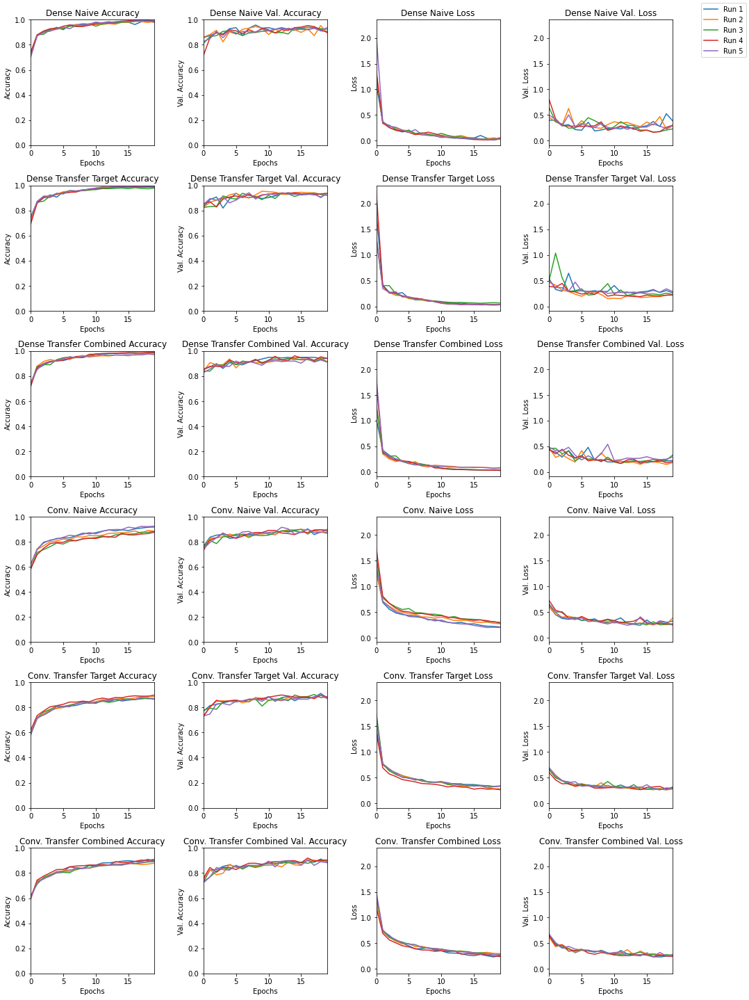

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

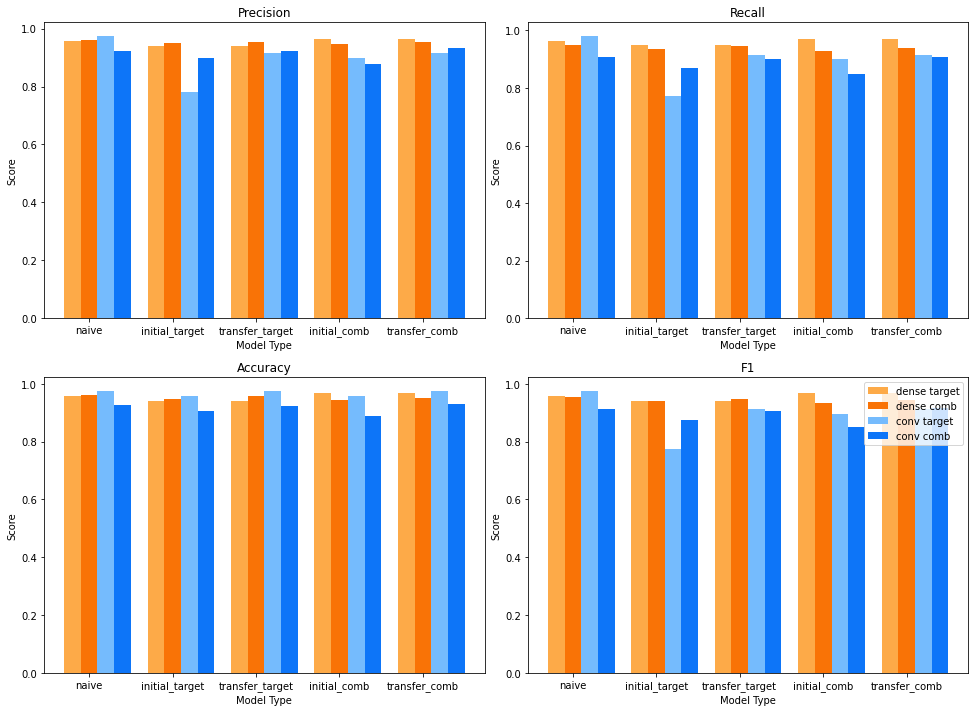

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 6 - Reduce Data and Drop Learning Rate

### Hyperparameters

In [ ]:
exp_name = "006_reduce_data_and_drop_learning_rate"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = 0.5

# Training
learning_rate = 0.00001
dense_train_layers = 2
conv_train_layers = 3
drop = False

### Select Data

In [ ]:
data_new["source"]["train"]["df"]

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
300,0.320363,0.857187,0.829047,0.024532,-0.181827,-0.597433,1.204968,0.098851,0.132763,0.339844,...,2.133983,1.578392,3.563417,2.017301,4.984403,14.182146,17.995760,3.660694,4.836455,0
1075,2.551357,0.313869,-1.011596,1.334123,0.484152,2.642270,0.075040,0.075040,2.650207,-0.511570,...,24.012504,42.345851,42.242076,53.502069,28.588099,10.983309,8.346036,7.301008,11.809258,1
535,-0.693398,0.069268,-0.388909,-0.020203,0.175334,-0.886048,-0.445189,-0.587332,-0.190486,0.505798,...,4.587014,3.348677,9.101283,4.118681,13.213393,3.135425,5.226459,4.840974,4.066516,0
1318,0.207081,-0.086585,-0.105344,0.292944,-0.019482,0.027418,-0.111117,0.155131,0.049065,0.466835,...,0.850289,1.206582,2.779558,1.013882,3.574368,2.959568,4.751655,1.535385,4.231575,2
561,0.484152,0.143586,0.944493,1.175385,-0.072154,0.184714,-0.036077,1.204968,0.016595,0.317477,...,3.468055,4.718621,1.169990,1.273513,5.351023,19.208579,5.324638,3.854763,3.861500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.776380,0.516931,1.227466,0.978828,0.390155,0.668276,0.677121,-0.166086,0.663363,0.338069,...,13.270944,5.325620,9.298984,18.851509,9.334966,20.700525,4.459948,8.101147,11.663256,1
1294,0.904087,-0.665979,-0.323249,2.218728,2.229551,0.580838,1.525330,1.634283,-0.209967,-0.350667,...,15.730988,7.303779,3.965011,11.958304,80.098148,36.900918,15.228956,22.192425,12.682468,1
860,-0.129877,-0.245323,-1.373807,-0.480544,-0.731639,0.673916,0.113281,0.586610,-0.606813,-1.795907,...,1.201444,9.855249,5.178913,7.344625,19.280261,17.089004,41.710031,42.454385,9.154264,1
1459,0.142143,-0.279235,-0.110395,-0.463949,-0.417049,-0.494253,-0.450961,-0.512292,-0.497139,-0.405504,...,2.343436,3.709108,0.456465,2.888107,1.666005,7.882459,3.797451,0.974740,2.408610,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
55/60 [==========================>...] - ETA: 0s - loss: 6.2944 - accuracy: 0.2591
Epoch 1: val_loss improved from inf to 3.85517, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_006_reduce_data_and_drop_learning_rate/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 2s 22ms/step - loss: 6.1220 - accuracy: 0.2614 - val_loss: 3.8552 - val_accuracy: 0.2689
Epoch 2/20
54/60 [==========================>...] - ETA: 0s - loss: 2.6889 - accuracy: 0.3958
Epoch 2: val_loss improved from 3.85517 to 1.80901, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_006_reduce_data_and_drop_learning_rate/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 0s 6ms/step - loss: 2.6102 - accuracy: 0.4013 - val_loss: 1.8090 - val_accuracy: 0.4664
Epoch 3/20
57/60 [=======================

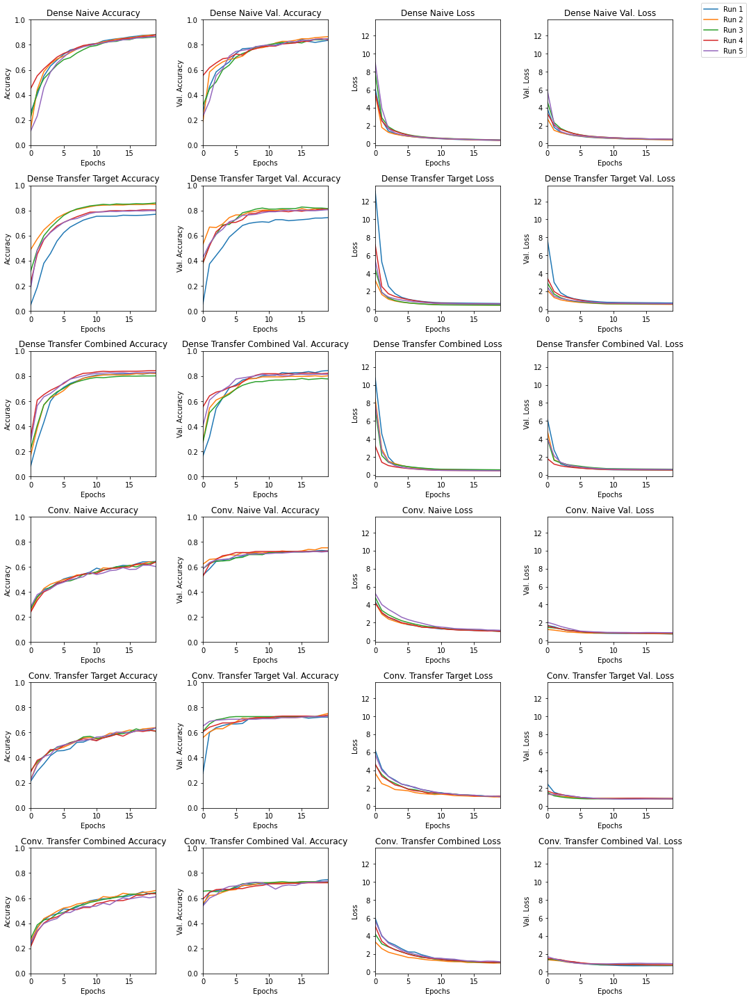

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

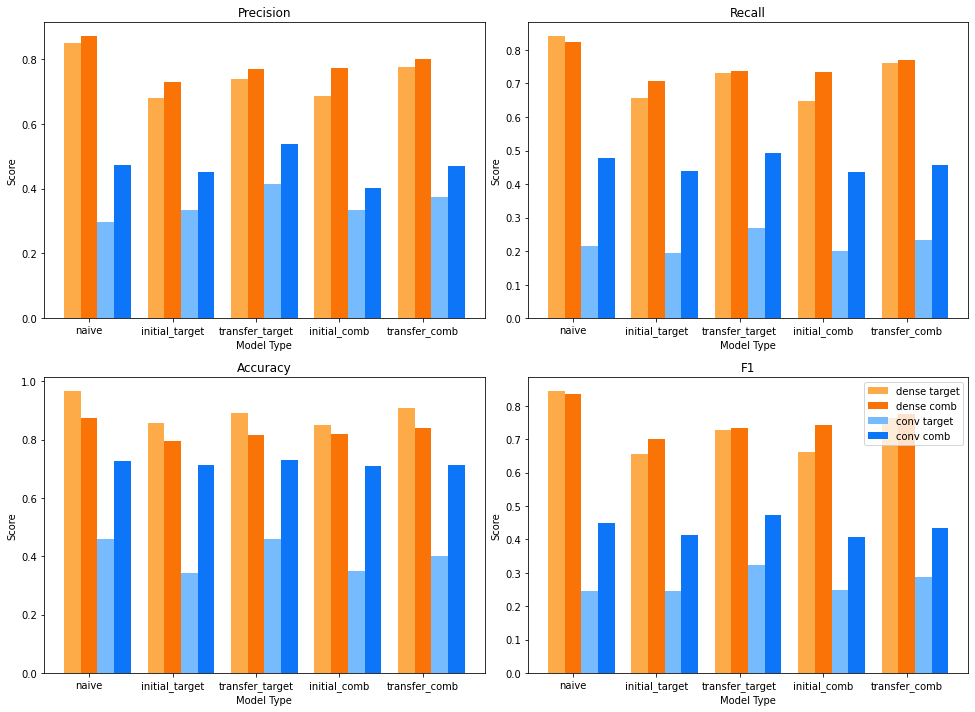

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 7 - Reduce Data and Drop Layers

### Hyperparameters

In [ ]:
exp_name = "007_reduce_data_and_drop_layers"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = 0.5

# Training
learning_rate = 0.001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new["source"]["train"]["df"]

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
300,0.320363,0.857187,0.829047,0.024532,-0.181827,-0.597433,1.204968,0.098851,0.132763,0.339844,...,2.133983,1.578392,3.563417,2.017301,4.984403,14.182146,17.995760,3.660694,4.836455,0
1075,2.551357,0.313869,-1.011596,1.334123,0.484152,2.642270,0.075040,0.075040,2.650207,-0.511570,...,24.012504,42.345851,42.242076,53.502069,28.588099,10.983309,8.346036,7.301008,11.809258,1
535,-0.693398,0.069268,-0.388909,-0.020203,0.175334,-0.886048,-0.445189,-0.587332,-0.190486,0.505798,...,4.587014,3.348677,9.101283,4.118681,13.213393,3.135425,5.226459,4.840974,4.066516,0
1318,0.207081,-0.086585,-0.105344,0.292944,-0.019482,0.027418,-0.111117,0.155131,0.049065,0.466835,...,0.850289,1.206582,2.779558,1.013882,3.574368,2.959568,4.751655,1.535385,4.231575,2
561,0.484152,0.143586,0.944493,1.175385,-0.072154,0.184714,-0.036077,1.204968,0.016595,0.317477,...,3.468055,4.718621,1.169990,1.273513,5.351023,19.208579,5.324638,3.854763,3.861500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.776380,0.516931,1.227466,0.978828,0.390155,0.668276,0.677121,-0.166086,0.663363,0.338069,...,13.270944,5.325620,9.298984,18.851509,9.334966,20.700525,4.459948,8.101147,11.663256,1
1294,0.904087,-0.665979,-0.323249,2.218728,2.229551,0.580838,1.525330,1.634283,-0.209967,-0.350667,...,15.730988,7.303779,3.965011,11.958304,80.098148,36.900918,15.228956,22.192425,12.682468,1
860,-0.129877,-0.245323,-1.373807,-0.480544,-0.731639,0.673916,0.113281,0.586610,-0.606813,-1.795907,...,1.201444,9.855249,5.178913,7.344625,19.280261,17.089004,41.710031,42.454385,9.154264,1
1459,0.142143,-0.279235,-0.110395,-0.463949,-0.417049,-0.494253,-0.450961,-0.512292,-0.497139,-0.405504,...,2.343436,3.709108,0.456465,2.888107,1.666005,7.882459,3.797451,0.974740,2.408610,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
42/60 [====================>.........] - ETA: 0s - loss: 3.3676 - accuracy: 0.6384
Epoch 1: val_loss improved from inf to 0.82144, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_007_reduce_data_and_drop_layers/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 2s 22ms/step - loss: 2.6048 - accuracy: 0.6957 - val_loss: 0.8214 - val_accuracy: 0.8025
Epoch 2/20
60/60 [==============================] - ETA: 0s - loss: 0.5344 - accuracy: 0.8518
Epoch 2: val_loss improved from 0.82144 to 0.62634, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_007_reduce_data_and_drop_layers/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 0s 4ms/step - loss: 0.5344 - accuracy: 0.8518 - val_loss: 0.6263 - val_accuracy: 0.8487
Epoch 3/20
55/60 [==========================>...] - ETA

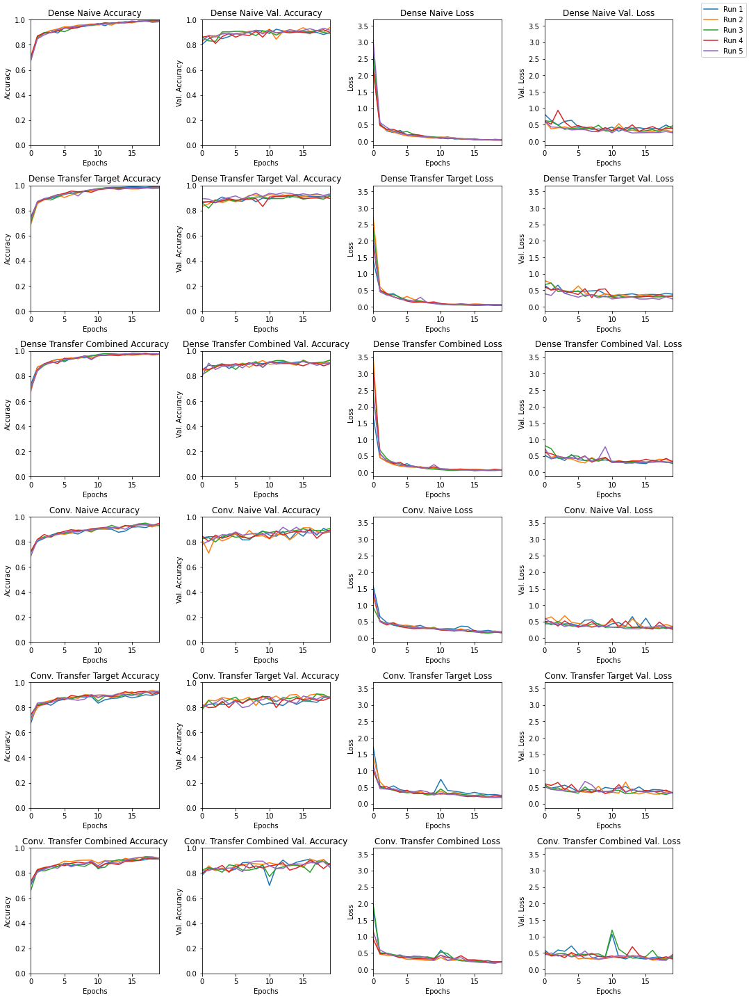

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

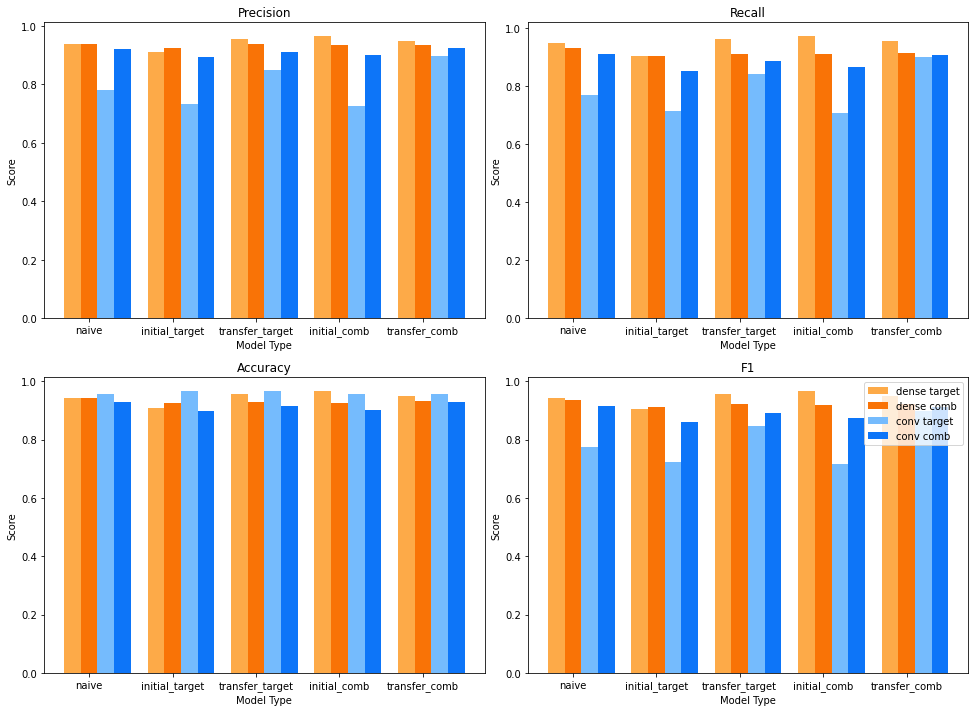

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 8 - Reduce Data and Drop Learning Rate and Drop Layers

### Hyperparameters

In [ ]:
exp_name = "008_reduce_data_and_drop_learning_rate_and_layers"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = 0.5

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new["source"]["train"]["df"]

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
300,0.320363,0.857187,0.829047,0.024532,-0.181827,-0.597433,1.204968,0.098851,0.132763,0.339844,...,2.133983,1.578392,3.563417,2.017301,4.984403,14.182146,17.995760,3.660694,4.836455,0
1075,2.551357,0.313869,-1.011596,1.334123,0.484152,2.642270,0.075040,0.075040,2.650207,-0.511570,...,24.012504,42.345851,42.242076,53.502069,28.588099,10.983309,8.346036,7.301008,11.809258,1
535,-0.693398,0.069268,-0.388909,-0.020203,0.175334,-0.886048,-0.445189,-0.587332,-0.190486,0.505798,...,4.587014,3.348677,9.101283,4.118681,13.213393,3.135425,5.226459,4.840974,4.066516,0
1318,0.207081,-0.086585,-0.105344,0.292944,-0.019482,0.027418,-0.111117,0.155131,0.049065,0.466835,...,0.850289,1.206582,2.779558,1.013882,3.574368,2.959568,4.751655,1.535385,4.231575,2
561,0.484152,0.143586,0.944493,1.175385,-0.072154,0.184714,-0.036077,1.204968,0.016595,0.317477,...,3.468055,4.718621,1.169990,1.273513,5.351023,19.208579,5.324638,3.854763,3.861500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.776380,0.516931,1.227466,0.978828,0.390155,0.668276,0.677121,-0.166086,0.663363,0.338069,...,13.270944,5.325620,9.298984,18.851509,9.334966,20.700525,4.459948,8.101147,11.663256,1
1294,0.904087,-0.665979,-0.323249,2.218728,2.229551,0.580838,1.525330,1.634283,-0.209967,-0.350667,...,15.730988,7.303779,3.965011,11.958304,80.098148,36.900918,15.228956,22.192425,12.682468,1
860,-0.129877,-0.245323,-1.373807,-0.480544,-0.731639,0.673916,0.113281,0.586610,-0.606813,-1.795907,...,1.201444,9.855249,5.178913,7.344625,19.280261,17.089004,41.710031,42.454385,9.154264,1
1459,0.142143,-0.279235,-0.110395,-0.463949,-0.417049,-0.494253,-0.450961,-0.512292,-0.497139,-0.405504,...,2.343436,3.709108,0.456465,2.888107,1.666005,7.882459,3.797451,0.974740,2.408610,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
41/60 [===================>..........] - ETA: 0s - loss: 33.2594 - accuracy: 0.1067
Epoch 1: val_loss improved from inf to 28.31995, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_008_reduce_data_and_drop_learning_rate_and_layers/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 1s 7ms/step - loss: 31.5766 - accuracy: 0.1090 - val_loss: 28.3200 - val_accuracy: 0.1176
Epoch 2/20
41/60 [===================>..........] - ETA: 0s - loss: 26.6178 - accuracy: 0.1181
Epoch 2: val_loss improved from 28.31995 to 22.76340, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_008_reduce_data_and_drop_learning_rate_and_layers/dense/naive/0/checkpoint.ckpt
60/60 [==============================] - 0s 5ms/step - loss: 25.6122 - accuracy: 0.1158 - val_loss: 22.7634 - val_accuracy: 0.1134
Epoch 3/20


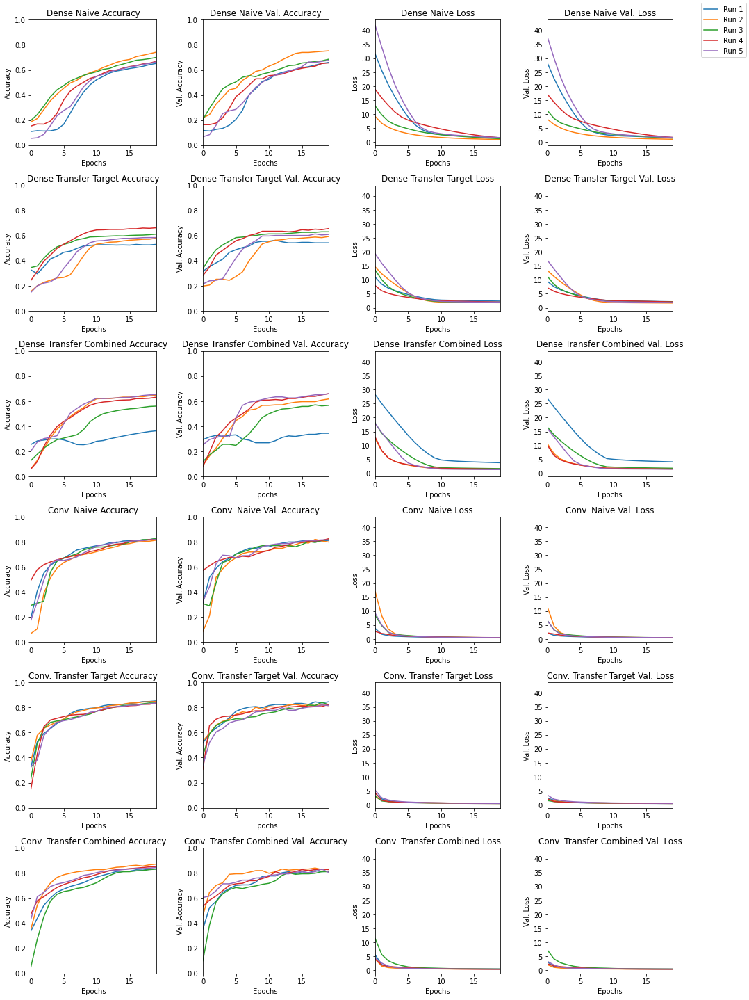

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

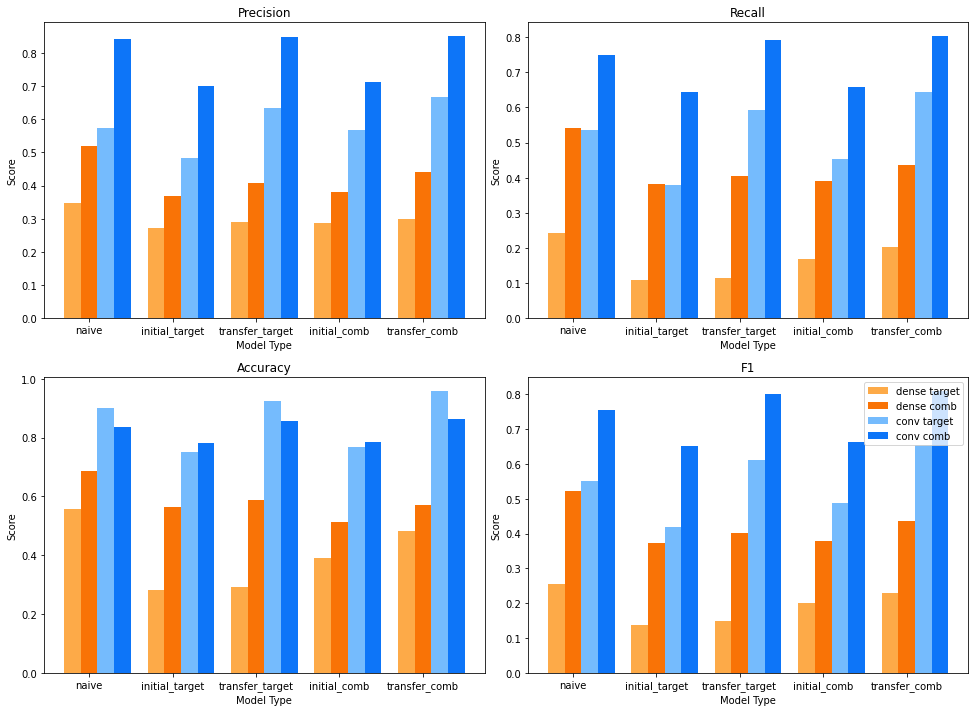

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 9 - Class Balancing Seperate

Balance class labels to even distributions across source dataset, and across target dataset (not between, though)

### Hyperparameters

In [ ]:
exp_name = "009_balance_classes_seperate_sets"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Data Selection

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        shapes = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            df.append(tmp.sample(frac=1, random_state=42))
            if tmp.shape[0] > 0:
                shapes.append(tmp.shape[0])

        min = sorted(shapes)[0]
        idxs = [x for x in range(min)]
        for i, x in enumerate(df):
            if df[i].shape[0] > 0:
                df[i].reset_index(inplace=True, drop=True)
                df[i] = df[i].loc[idxs]

        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (1460, 406)
x   (1460, 405)
y   (1460, 1)
x_shaped   (1460, 27, 15)

val ---------------------------------------------
df   (184, 406)
x   (184, 405)
y   (184, 1)
x_shaped   (184, 27, 15)

test ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)


target =============================================
train ---------------------------------------------
df   (316, 406)
x   (316, 405)
y   (316, 1)
x_shaped   (316, 27, 15)

val ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

test ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)


comb =============================================
train ---------------------------------------------
df   (948, 406)
x   (948, 405)
y   (948, 1)
x_shaped   (948, 27, 15

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
892,0.196980,0.054837,0.002886,0.157295,0.138535,0.108231,0.488481,-0.176777,-0.738133,0.207081,...,6.186235,6.072828,1.127633,3.537859,2.549165,4.365697,4.018901,4.696536,7.369446,2
1105,-0.627016,-0.521672,0.715044,0.246044,-0.639282,0.585167,0.027418,-0.055558,0.370149,-0.765551,...,21.964441,11.026611,9.511863,10.460873,12.498174,7.255384,4.046896,2.022552,5.904603,3
413,-2.103282,-0.506519,-0.010823,-0.982013,-1.815388,-0.378807,0.253981,-1.215791,-2.087408,-1.854351,...,39.741484,51.946530,15.500677,8.047527,8.058500,7.373692,0.353481,3.758993,0.629002,1
522,-0.339844,-0.933670,2.202133,2.772147,1.210740,0.640725,2.595371,1.898365,-0.350667,-0.494253,...,9.125237,19.683993,22.445791,45.634638,68.442445,24.356743,6.832899,8.544960,3.952686,1
1036,0.434366,-0.190486,0.849250,0.404061,0.829768,0.483430,0.517342,0.813173,0.962531,0.031748,...,4.406413,1.406502,3.025397,3.627181,5.957636,12.067264,9.767813,11.249078,0.867270,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,-0.738133,-0.290058,0.326135,-0.660928,-0.486316,-0.431479,-0.027418,0.520229,0.260475,-0.439416,...,1.861308,10.664378,1.612922,9.496859,15.658603,9.727803,8.051674,23.727034,16.294366,3
1130,0.870174,1.509457,0.742462,0.962531,-0.171004,0.643611,0.900479,0.704942,1.622738,0.380972,...,9.397107,5.272419,5.241952,6.425572,4.547708,4.757127,5.010582,1.088005,6.673745,3
1294,2.057104,0.544761,0.253981,0.348503,1.221563,1.557078,2.078750,0.428593,0.046178,0.722981,...,3.078147,3.803901,8.595875,5.449801,5.406822,1.795831,3.717197,9.173969,5.605521,3
860,0.044014,0.090914,-0.124104,0.124104,0.158017,0.080812,0.127712,0.027418,0.937999,0.263361,...,4.018581,4.395213,3.384049,7.743293,18.095521,3.402545,2.314169,1.638863,1.362910,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
21/30 [====================>.........] - ETA: 0s - loss: 14.9872 - accuracy: 0.1637
Epoch 1: val_loss improved from inf to 14.32126, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_009_balance_classes_seperate_sets/dense/naive/0/checkpoint.ckpt
30/30 [==============================] - 1s 41ms/step - loss: 14.9101 - accuracy: 0.1540 - val_loss: 14.3213 - val_accuracy: 0.1583
Epoch 2/20
22/30 [=====================>........] - ETA: 0s - loss: 13.3958 - accuracy: 0.1591
Epoch 2: val_loss improved from 14.32126 to 12.76631, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_009_balance_classes_seperate_sets/dense/naive/0/checkpoint.ckpt
30/30 [==============================] - 0s 5ms/step - loss: 13.2589 - accuracy: 0.1667 - val_loss: 12.7663 - val_accuracy: 0.1833
Epoch 3/20
21/30 [====================>...

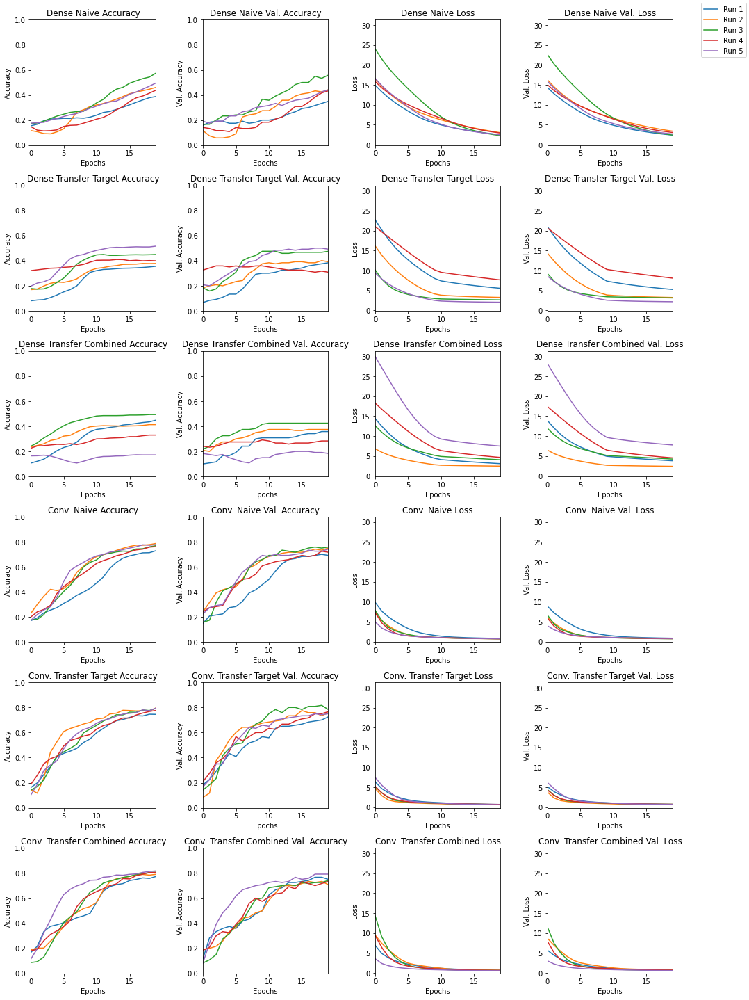

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

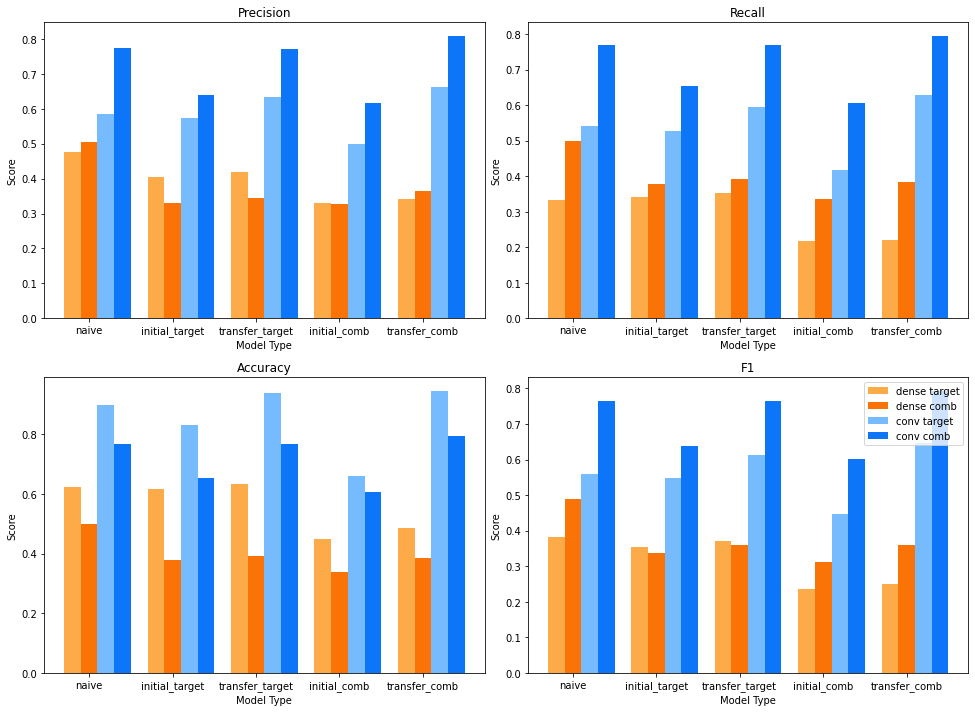

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 10 - Class Balancing Combined

Balance all class label counts

### Hyperparameters

In [ ]:
exp_name = "010_balance_classes_combine_sets"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Data Selection

In [ ]:
# Get shapes
comb_shapes = {}
for k1 in data.keys():
    comb_shapes.update({k1: [None] * 6})
    for k2 in data[k1].keys():
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if comb_shapes[k1][i] is None and tmp.shape[0] > 0:
                comb_shapes[k1][i] = tmp.shape[0]
            elif tmp.shape[0] > 0 and tmp.shape[0] < comb_shapes[k1][i]:
                comb_shapes[k1][i] = tmp.shape[0]
    print(k1, comb_shapes[k1])
for k1 in comb_shapes:
    comb_shapes[k1] = sorted([x for x in comb_shapes[k1] if x is not None])
print(comb_shapes)

# Select data
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    shapes = []
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            df.append(tmp.sample(frac=1, random_state=42))

        min = comb_shapes[k1][0]
        idxs = [x for x in range(min)]
        for i, x in enumerate(df):
            if df[i].shape[0] > 0:
                df[i].reset_index(inplace=True, drop=True)
                df[i] = df[i].loc[idxs]

        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source [173, 155, 57, 45, None, None]
target [None, None, None, None, 26, 20]
comb [173, 155, 57, 45, 26, 20]
{'source': [45, 57, 155, 173], 'target': [20, 26], 'comb': [20, 26, 45, 57, 155, 173]}
source =============================================
train ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)

val ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)

test ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)


target =============================================
train ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

val ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

test ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shape

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
19,0.243880,-0.561356,-1.335566,-0.533938,-0.069989,0.273463,-0.119054,0.318198,0.491367,-0.132763,...,1.304302,6.333576,3.898663,5.272897,3.872304,17.897138,7.572303,6.059782,2.556599,0
42,0.904087,-0.940885,1.180435,-0.663093,1.628510,1.299489,1.390403,0.090192,0.404061,-0.375921,...,20.954409,22.305573,23.612877,24.815821,20.393704,13.988387,3.520282,11.631598,12.146851,0
153,0.376643,0.500026,0.292223,-0.209967,0.646498,0.469721,0.422821,0.329021,0.116168,0.349224,...,8.376354,8.111059,5.501730,2.804801,2.681030,7.642058,3.483795,6.427709,7.728841,3
78,0.109674,-0.433644,-0.743905,0.050508,0.031026,-0.572179,-0.380972,0.082977,-0.362933,-0.704221,...,0.893748,3.569923,4.710553,7.180730,5.301728,84.451539,4.351595,8.132126,2.167323,1
145,-0.627016,-0.521672,0.715044,0.246044,-0.639282,0.585167,0.027418,-0.055558,0.370149,-0.765551,...,21.964441,11.026611,9.511863,10.460873,12.498174,7.255384,4.046896,2.022552,5.904603,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0.392121,1.921294,0.748863,1.246139,0.376397,-0.013759,0.201466,0.577862,0.295811,-0.271242,...,10.099071,14.301493,10.029387,6.009450,2.380169,1.005637,8.412599,10.705135,1.736199,1
106,-0.861516,-0.314590,-0.132763,0.015874,-1.862288,-0.173891,-0.721538,-0.890377,-0.652270,-0.746791,...,1.672023,15.877082,4.624240,12.376452,12.288473,5.796080,9.956129,39.138783,22.156183,2
14,0.207803,0.715765,-0.027418,-0.031026,0.151523,-0.224398,0.220790,-0.064217,-0.097408,-0.002886,...,1.670584,1.204066,1.602980,4.413623,3.480417,14.330647,12.443106,5.446274,6.438241,0
92,0.199866,0.110395,-0.613307,0.039685,-0.271298,-0.041128,-0.027418,0.190486,-0.194094,0.320363,...,14.101807,4.989420,6.820244,3.790640,3.553903,5.994776,6.587863,0.738874,3.721391,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
1/4 [======>.......................] - ETA: 0s - loss: 9.6706 - accuracy: 0.2188
Epoch 1: val_loss improved from inf to 12.26067, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_010_balance_classes_combine_sets/dense/naive/0/checkpoint.ckpt
4/4 [==============================] - 1s 368ms/step - loss: 10.7430 - accuracy: 0.2333 - val_loss: 12.2607 - val_accuracy: 0.0833
Epoch 2/20
1/4 [======>.......................] - ETA: 0s - loss: 11.2871 - accuracy: 0.2500
Epoch 2: val_loss improved from 12.26067 to 12.13548, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_010_balance_classes_combine_sets/dense/naive/0/checkpoint.ckpt
4/4 [==============================] - 0s 38ms/step - loss: 10.5907 - accuracy: 0.2333 - val_loss: 12.1355 - val_accuracy: 0.0750
Epoch 3/20
1/4 [======>.......................] - E

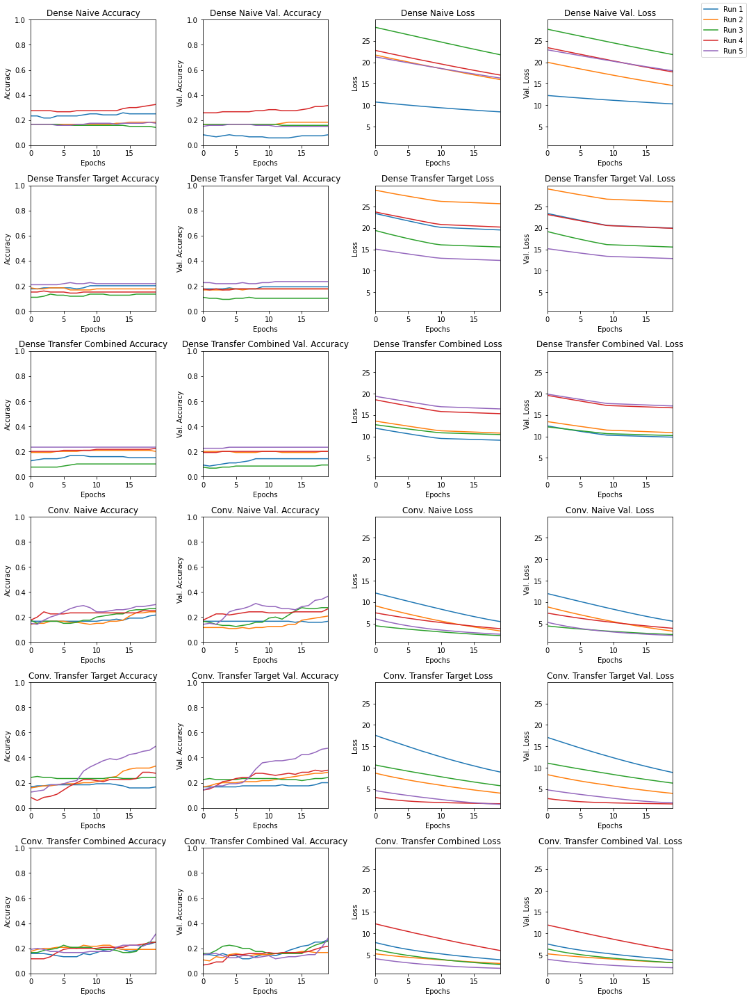

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

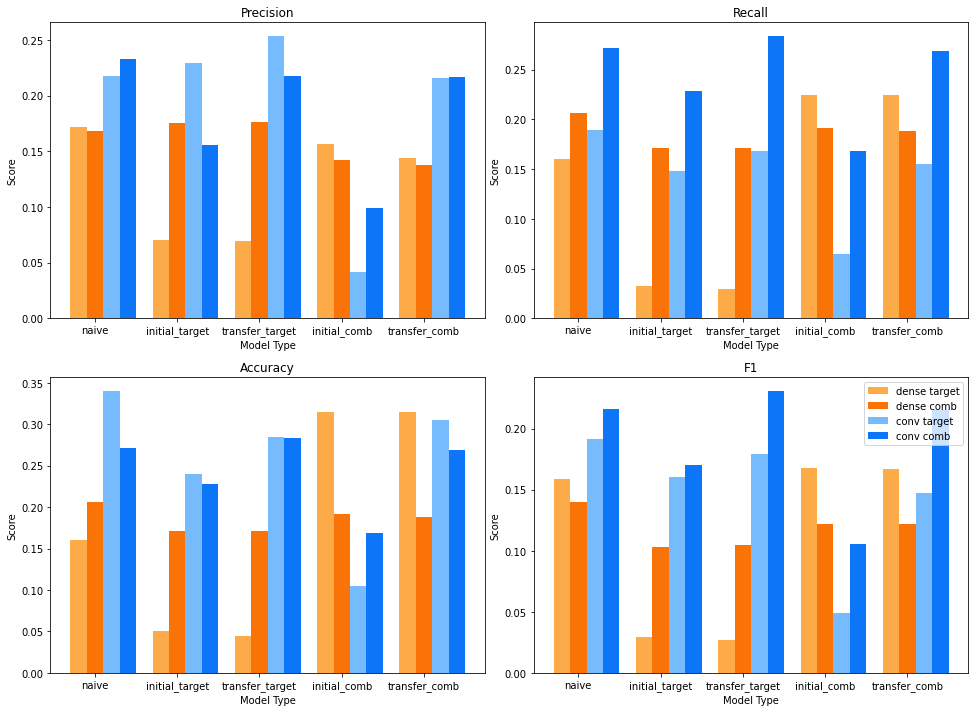

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 11 - Class Balancing Taregt Only

Balance the classes only in the target set.

### Hyperparameters

In [ ]:
exp_name = "011_balance_classes_target"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
# Get shapes
comb_shapes = {}
for k1 in data.keys():
    comb_shapes.update({k1: [None] * 6})
    for k2 in data[k1].keys():
        for i in range(2):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i+4]
            if comb_shapes[k1][i+4] is None and tmp.shape[0] > 0:
                comb_shapes[k1][i+4] = tmp.shape[0]
            elif tmp.shape[0] > 0 and tmp.shape[0] < comb_shapes[k1][i+4]:
                comb_shapes[k1][i+4] = tmp.shape[0]
for k1 in comb_shapes:
    comb_shapes[k1] = sorted([x for x in comb_shapes[k1] if x is not None])

# Select data
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    shapes = []
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            df.append(tmp.sample(frac=1, random_state=42))

        if len(comb_shapes[k1]) > 0:
            min = comb_shapes[k1][0]
            idxs = [x for x in range(min)]
            for i, x in enumerate(df):
                if df[i].shape[0] > 0 and i > 3:
                    df[i].reset_index(inplace=True, drop=True)
                    df[i] = df[i].loc[idxs]

        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

val ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

test ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3490, 406)
x   (3490, 405)
y   (3490, 1)
x_shaped   (3490, 27, 15

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,0.000000,0.000000,2.329845,0.698448,-1.419986,1.026026,-0.146472,2.824098,0.000000,1.412049,...,16.259829,5.826764,48.782375,26.160325,42.227101,17.750930,23.971497,10.423439,7.895366,1
51,1.244652,1.668916,1.901251,0.165232,-0.022368,1.506570,1.249703,1.119826,0.878111,1.017368,...,2.337124,1.264385,1.999794,2.775694,2.954516,2.486035,3.467841,2.992901,20.498052,0
567,0.825439,-0.401175,-0.176777,2.624954,1.077977,0.251095,0.769159,1.028191,1.544812,2.067927,...,4.803895,2.786396,5.999025,3.308708,4.062900,22.395624,2.862035,2.124693,3.939869,0
1612,-1.080142,-0.694119,-1.116219,-1.482038,0.577952,2.056382,-0.547647,0.434366,-0.937277,-1.406998,...,19.796415,59.211374,95.253148,24.818327,10.109106,10.419095,12.640858,4.487118,4.688882,1
1164,0.621965,0.846364,1.061382,1.230943,1.840642,1.520280,0.402618,0.505076,-0.437252,2.360871,...,3.171226,4.745227,8.038926,14.529196,4.960343,4.527268,4.250839,3.455995,2.439746,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.261918,0.199144,-0.767716,0.500026,-0.878833,-1.642219,-0.077926,-0.365098,0.355718,0.013709,...,2.661018,2.149397,4.693772,4.830147,7.983009,14.090729,7.223338,2.011339,1.973386,0
1130,-0.787197,0.945214,0.748956,-0.704942,-0.849250,0.224398,0.994279,0.809565,-0.237386,-0.492089,...,5.910049,1.294422,1.878150,3.220948,6.421690,7.780890,11.647518,29.969515,8.390531,0
1294,-0.046900,0.694119,1.357212,0.737411,0.942328,0.851414,1.334123,1.795907,1.624903,0.566407,...,3.234914,4.003703,3.065166,1.543484,2.330630,0.903779,2.340355,2.742752,19.323005,0
860,-0.367984,-0.460341,-0.158017,-0.018760,0.060609,0.259754,0.491367,-0.137814,-0.522393,-0.355718,...,3.408112,2.909824,1.095597,0.187373,17.907336,1.659711,2.037160,0.318574,1.823150,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
108/110 [============================>.] - ETA: 0s - loss: 28.1064 - accuracy: 0.1328
Epoch 1: val_loss improved from inf to 21.53648, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_011_balance_classes_target/dense/naive/0/checkpoint.ckpt
110/110 [==============================] - 2s 14ms/step - loss: 28.0775 - accuracy: 0.1321 - val_loss: 21.5365 - val_accuracy: 0.1229
Epoch 2/20
100/110 [==========================>...] - ETA: 0s - loss: 17.2254 - accuracy: 0.1791
Epoch 2: val_loss improved from 21.53648 to 12.96262, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_011_balance_classes_target/dense/naive/0/checkpoint.ckpt
110/110 [==============================] - 0s 4ms/step - loss: 16.8248 - accuracy: 0.1845 - val_loss: 12.9626 - val_accuracy: 0.2182
Epoch 3/20
 98/110 [=========================>..

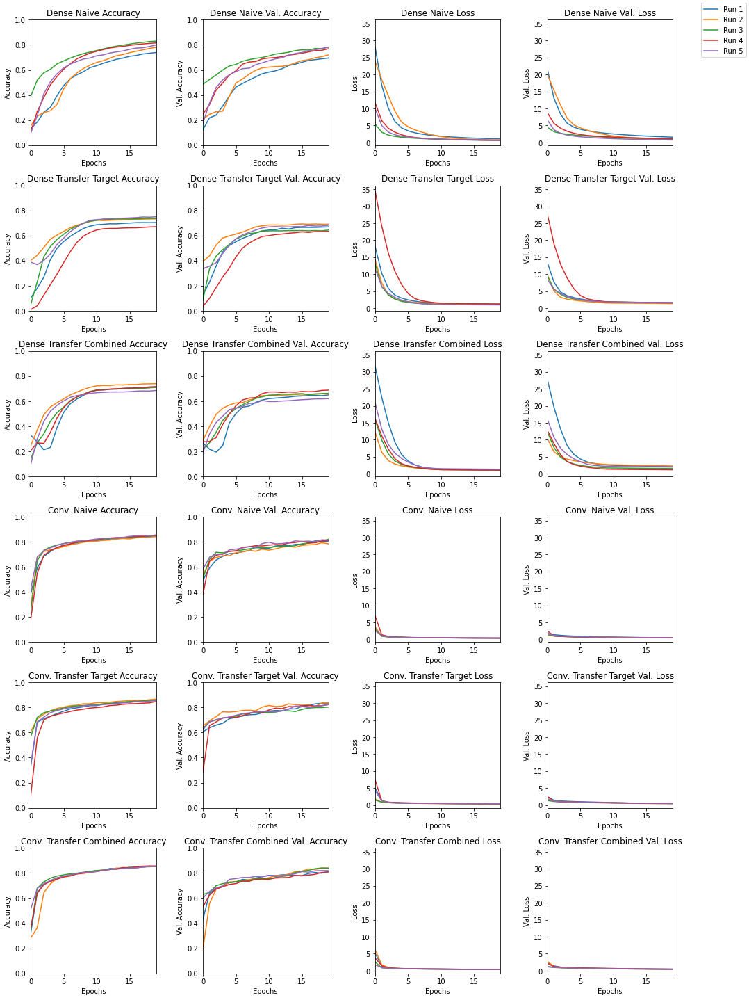

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

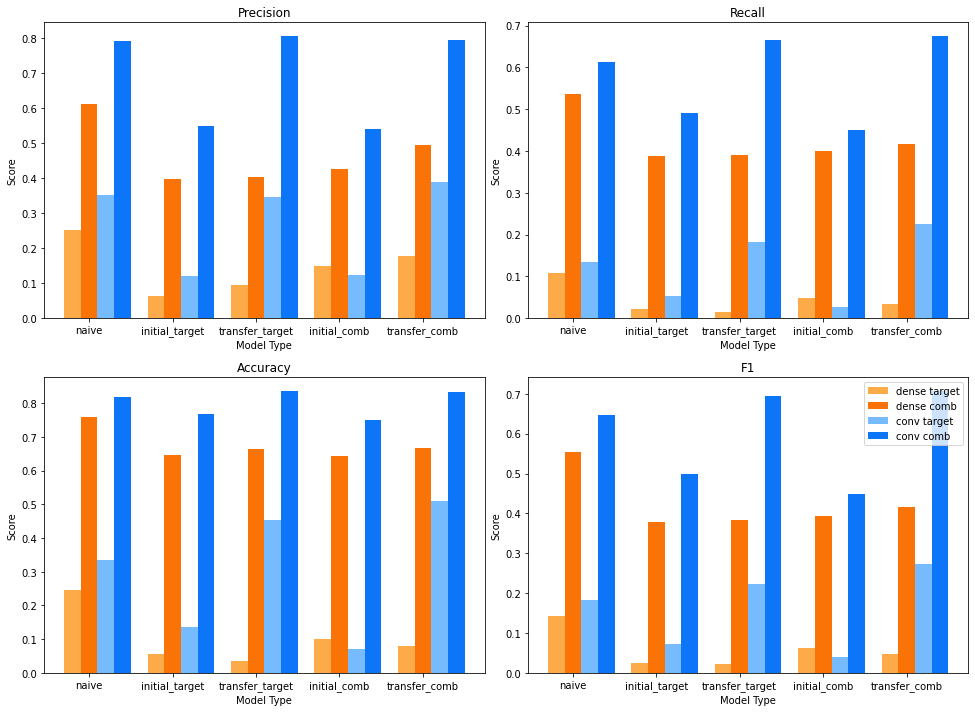

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 12 - Class Balancing Source Only

Balance classes only in source set.

### Hyperparameters

In [ ]:
exp_name = "012_balance_classes_source"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
# Get shapes
comb_shapes = {}
for k1 in data.keys():
    comb_shapes.update({k1: [None] * 6})
    for k2 in data[k1].keys():
        for i in range(4):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if comb_shapes[k1][i] is None and tmp.shape[0] > 0:
                comb_shapes[k1][i] = tmp.shape[0]
            elif tmp.shape[0] > 0 and tmp.shape[0] < comb_shapes[k1][i]:
                comb_shapes[k1][i] = tmp.shape[0]
for k1 in comb_shapes:
    comb_shapes[k1] = sorted([x for x in comb_shapes[k1] if x is not None])

# Select data
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    shapes = []
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            df.append(tmp.sample(frac=1, random_state=42))

        if len(comb_shapes[k1]) > 0:
            min = comb_shapes[k1][0]
            idxs = [x for x in range(min)]
            for i, x in enumerate(df):
                if df[i].shape[0] > 0 and i < 4:
                    df[i].reset_index(inplace=True, drop=True)
                    df[i] = df[i].loc[idxs]

        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)

val ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)

test ---------------------------------------------
df   (180, 406)
x   (180, 405)
y   (180, 1)
x_shaped   (180, 27, 15)


target =============================================
train ---------------------------------------------
df   (369, 406)
x   (369, 405)
y   (369, 1)
x_shaped   (369, 27, 15)

val ---------------------------------------------
df   (46, 406)
x   (46, 405)
y   (46, 1)
x_shaped   (46, 27, 15)

test ---------------------------------------------
df   (47, 406)
x   (47, 405)
y   (47, 1)
x_shaped   (47, 27, 15)


comb =============================================
train ---------------------------------------------
df   (549, 406)
x   (549, 405)
y   (549, 1)
x_shaped   (549, 27, 15)

v

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
19,0.243880,-0.561356,-1.335566,-0.533938,-0.069989,0.273463,-0.119054,0.318198,0.491367,-0.132763,...,1.304302,6.333576,3.898663,5.272897,3.872304,17.897138,7.572303,6.059782,2.556599,0
42,0.904087,-0.940885,1.180435,-0.663093,1.628510,1.299489,1.390403,0.090192,0.404061,-0.375921,...,20.954409,22.305573,23.612877,24.815821,20.393704,13.988387,3.520282,11.631598,12.146851,0
153,0.376643,0.500026,0.292223,-0.209967,0.646498,0.469721,0.422821,0.329021,0.116168,0.349224,...,8.376354,8.111059,5.501730,2.804801,2.681030,7.642058,3.483795,6.427709,7.728841,3
78,0.109674,-0.433644,-0.743905,0.050508,0.031026,-0.572179,-0.380972,0.082977,-0.362933,-0.704221,...,0.893748,3.569923,4.710553,7.180730,5.301728,84.451539,4.351595,8.132126,2.167323,1
145,-0.627016,-0.521672,0.715044,0.246044,-0.639282,0.585167,0.027418,-0.055558,0.370149,-0.765551,...,21.964441,11.026611,9.511863,10.460873,12.498174,7.255384,4.046896,2.022552,5.904603,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0.392121,1.921294,0.748863,1.246139,0.376397,-0.013759,0.201466,0.577862,0.295811,-0.271242,...,10.099071,14.301493,10.029387,6.009450,2.380169,1.005637,8.412599,10.705135,1.736199,1
106,-0.861516,-0.314590,-0.132763,0.015874,-1.862288,-0.173891,-0.721538,-0.890377,-0.652270,-0.746791,...,1.672023,15.877082,4.624240,12.376452,12.288473,5.796080,9.956129,39.138783,22.156183,2
14,0.207803,0.715765,-0.027418,-0.031026,0.151523,-0.224398,0.220790,-0.064217,-0.097408,-0.002886,...,1.670584,1.204066,1.602980,4.413623,3.480417,14.330647,12.443106,5.446274,6.438241,0
92,0.199866,0.110395,-0.613307,0.039685,-0.271298,-0.041128,-0.027418,0.190486,-0.194094,0.320363,...,14.101807,4.989420,6.820244,3.790640,3.553903,5.994776,6.587863,0.738874,3.721391,2


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
18/18 [==============================] - ETA: 0s - loss: 14.7056 - accuracy: 0.0528
Epoch 1: val_loss improved from inf to 12.31409, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_012_balance_classes_source/dense/naive/0/checkpoint.ckpt
18/18 [==============================] - 1s 68ms/step - loss: 14.7056 - accuracy: 0.0528 - val_loss: 12.3141 - val_accuracy: 0.0796
Epoch 2/20
 1/18 [>.............................] - ETA: 0s - loss: 15.6945 - accuracy: 0.0312
Epoch 2: val_loss improved from 12.31409 to 11.64649, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_012_balance_classes_source/dense/naive/0/checkpoint.ckpt
18/18 [==============================] - 0s 9ms/step - loss: 13.8958 - accuracy: 0.0492 - val_loss: 11.6465 - val_accuracy: 0.0929
Epoch 3/20
 1/18 [>.............................] - ETA:

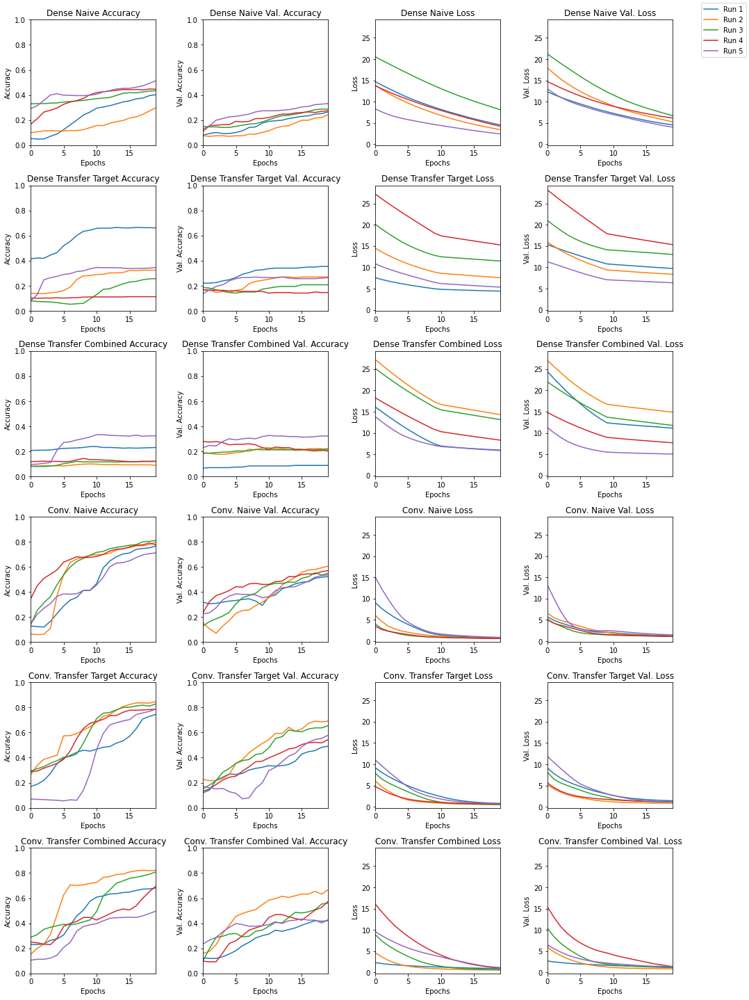

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

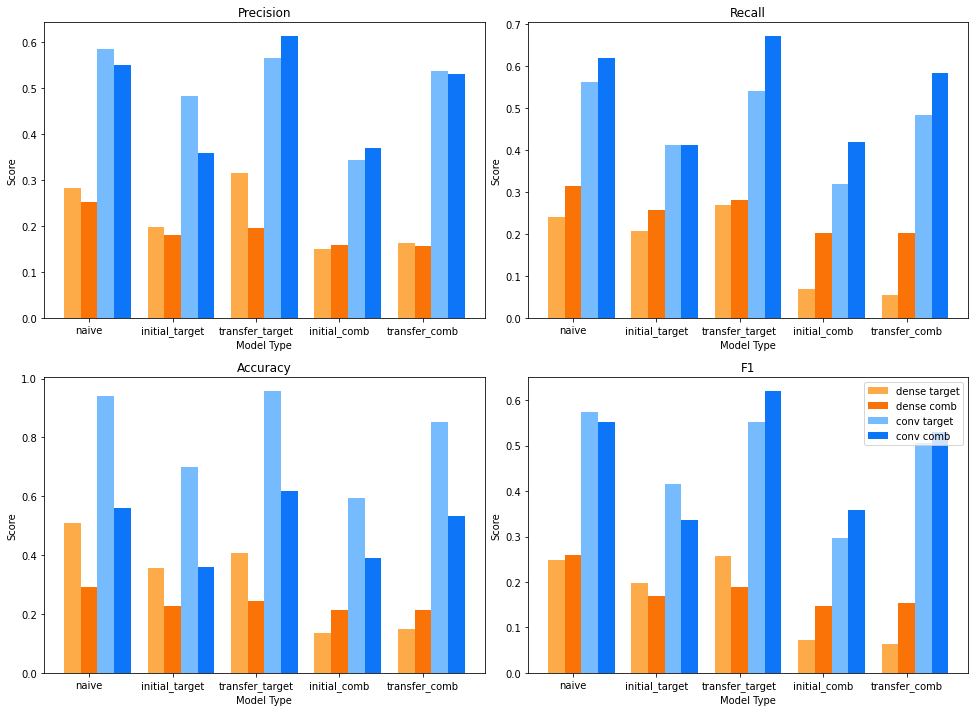

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 13 - One-Shot Learning

One example per activity in target set.

### Hyperparameters

In [ ]:
exp_name = "013_one_shot"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = [0]

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if i < 4 or tmp.shape[0] < 1:
                df.append(tmp)
            else:
                tmp.reset_index(drop=True, inplace=True)
                tmp = tmp.loc[keep]
                df.append(tmp)
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (2, 406)
x   (2, 405)
y   (2, 1)
x_shaped   (2, 27, 15)

val ---------------------------------------------
df   (2, 406)
x   (2, 405)
y   (2, 1)
x_shaped   (2, 27, 15)

test ---------------------------------------------
df   (2, 406)
x   (2, 405)
y   (2, 1)
x_shaped   (2, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3452, 406)
x   (3452, 405)
y   (3452, 1)
x_shaped   (3452, 27, 15)

val -----

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,-0.745348,0.025975,1.622738,-0.177498,0.492810,0.748956,0.621965,-0.201309,-0.792970,0.069268,...,3.144780,6.127232,10.918991,71.795743,12.076758,9.420503,5.632002,6.602226,4.402164,1
51,0.574344,0.116168,0.480544,0.282121,0.223677,0.121940,0.024532,0.621965,0.756893,0.129155,...,3.138702,1.583315,1.629287,1.435926,2.785927,14.339952,1.332868,1.767754,1.310332,0
567,0.716487,1.207854,1.562129,0.450239,0.538989,0.790805,0.840591,0.583724,0.989949,1.052002,...,0.624273,0.159947,1.441267,3.065636,1.217022,5.290516,4.493734,1.839459,0.950692,0
1612,-0.132763,-0.328300,-1.288666,-1.296603,-0.121940,0.326135,0.564242,-1.993608,-0.649384,-0.038241,...,15.861379,68.510340,22.441009,6.250366,4.581374,7.714956,5.165075,5.297685,6.255275,1
1164,0.647219,0.718651,0.870896,1.465443,2.243260,2.009482,1.531103,0.013709,-0.187600,1.586661,...,4.091803,3.801050,5.726817,6.056255,13.798184,2.464731,8.692509,2.610989,2.189017,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.378807,0.196980,0.451682,0.285007,0.723702,0.614028,0.721538,0.616193,1.015203,0.967582,...,1.931308,1.403936,1.739083,2.020850,19.300776,5.051519,1.307955,1.581536,0.873401,0
1130,2.185537,1.093851,-0.189043,0.936556,2.212956,0.898314,0.806679,0.923568,1.134979,1.862288,...,6.294310,3.520305,2.175372,11.821230,15.477374,4.373221,7.200974,1.694572,2.608246,0
1294,0.367984,0.716487,0.689068,1.517393,-0.025254,0.929340,-0.676802,-0.115446,-0.256867,-0.195537,...,6.907540,2.007291,6.243282,3.862777,12.079109,18.057692,4.732844,6.778083,4.237873,0
860,0.730196,0.336958,0.544761,0.666701,0.652270,0.668865,0.751842,0.986342,0.640725,1.017368,...,2.400667,2.222785,1.527698,3.260122,4.705362,3.873768,1.956542,1.354238,1.652232,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
 95/108 [=========================>....] - ETA: 0s - loss: 29.1363 - accuracy: 0.1145
Epoch 1: val_loss improved from inf to 22.08768, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_013_one_shot/dense/naive/0/checkpoint.ckpt
108/108 [==============================] - 2s 13ms/step - loss: 28.3648 - accuracy: 0.1141 - val_loss: 22.0877 - val_accuracy: 0.1129
Epoch 2/20
100/108 [==========================>...] - ETA: 0s - loss: 16.9077 - accuracy: 0.1409
Epoch 2: val_loss improved from 22.08768 to 12.38058, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_013_one_shot/dense/naive/0/checkpoint.ckpt
108/108 [==============================] - 0s 4ms/step - loss: 16.5819 - accuracy: 0.1451 - val_loss: 12.3806 - val_accuracy: 0.1982
Epoch 3/20
 99/108 [==========================>...] - ETA: 0s - loss: 9.2424

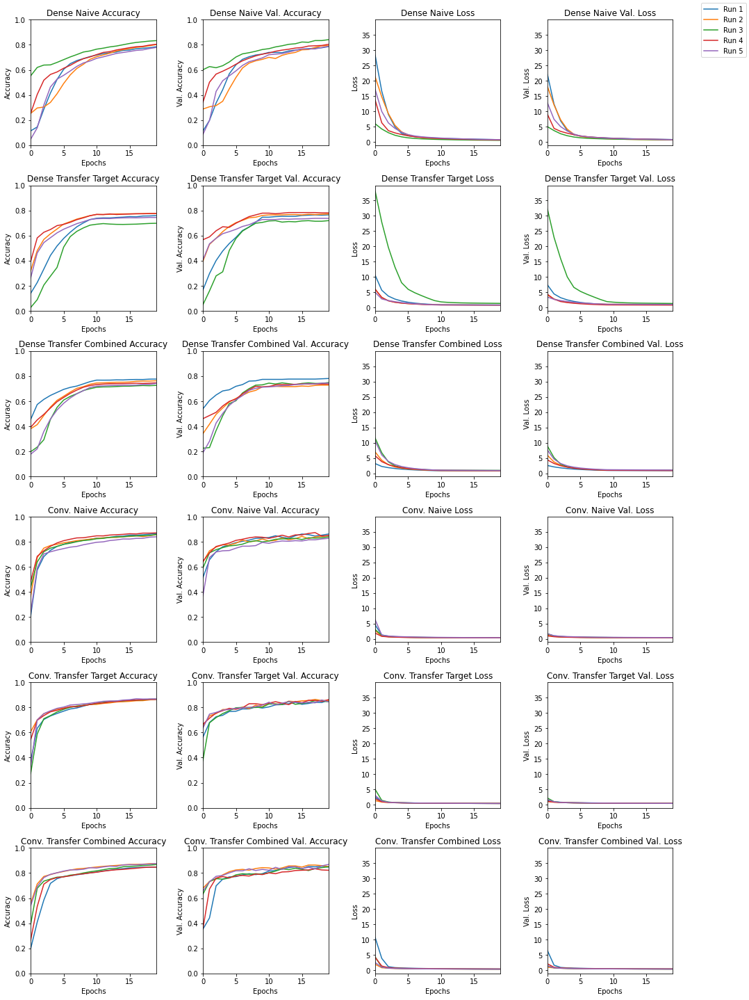

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

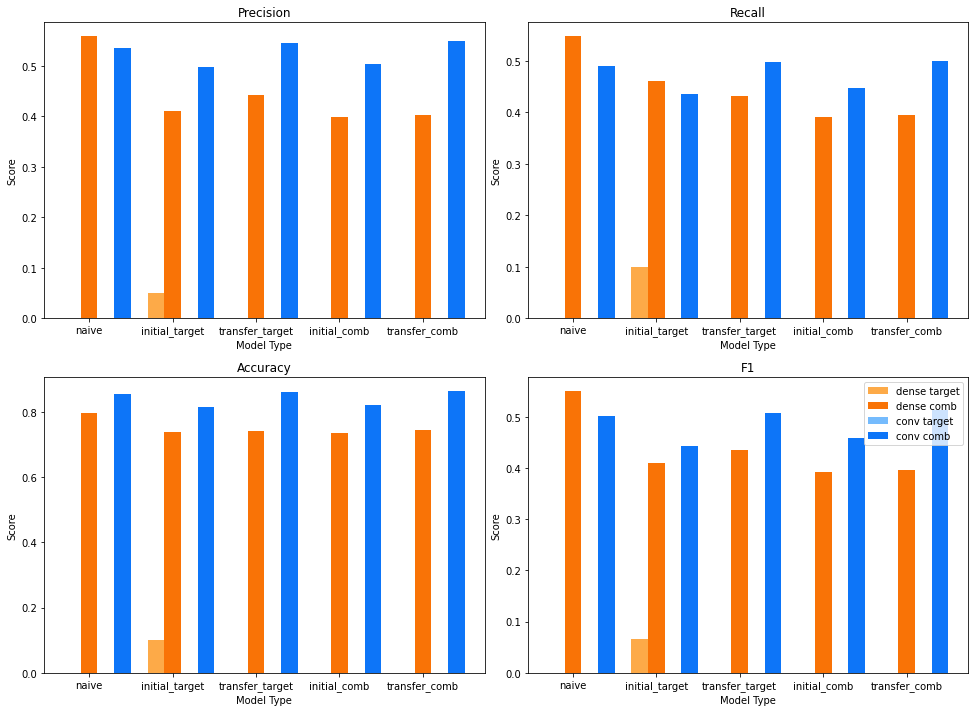

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 14 - Two-Shot Learning

Two examples per activity in target set.

### Hyperparameters

In [ ]:
exp_name = "014_two_shot"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = [x for x in range(2)]

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if i < 4 or tmp.shape[0] < 1:
                df.append(tmp)
            else:
                tmp.reset_index(drop=True, inplace=True)
                tmp = tmp.loc[keep]
                df.append(tmp)
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (4, 406)
x   (4, 405)
y   (4, 1)
x_shaped   (4, 27, 15)

val ---------------------------------------------
df   (4, 406)
x   (4, 405)
y   (4, 1)
x_shaped   (4, 27, 15)

test ---------------------------------------------
df   (4, 406)
x   (4, 405)
y   (4, 1)
x_shaped   (4, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3454, 406)
x   (3454, 405)
y   (3454, 1)
x_shaped   (3454, 27, 15)

val -----

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,-0.745348,0.025975,1.622738,-0.177498,0.492810,0.748956,0.621965,-0.201309,-0.792970,0.069268,...,3.144780,6.127232,10.918991,71.795743,12.076758,9.420503,5.632002,6.602226,4.402164,1
51,0.574344,0.116168,0.480544,0.282121,0.223677,0.121940,0.024532,0.621965,0.756893,0.129155,...,3.138702,1.583315,1.629287,1.435926,2.785927,14.339952,1.332868,1.767754,1.310332,0
567,0.716487,1.207854,1.562129,0.450239,0.538989,0.790805,0.840591,0.583724,0.989949,1.052002,...,0.624273,0.159947,1.441267,3.065636,1.217022,5.290516,4.493734,1.839459,0.950692,0
1612,-0.132763,-0.328300,-1.288666,-1.296603,-0.121940,0.326135,0.564242,-1.993608,-0.649384,-0.038241,...,15.861379,68.510340,22.441009,6.250366,4.581374,7.714956,5.165075,5.297685,6.255275,1
1164,0.647219,0.718651,0.870896,1.465443,2.243260,2.009482,1.531103,0.013709,-0.187600,1.586661,...,4.091803,3.801050,5.726817,6.056255,13.798184,2.464731,8.692509,2.610989,2.189017,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.378807,0.196980,0.451682,0.285007,0.723702,0.614028,0.721538,0.616193,1.015203,0.967582,...,1.931308,1.403936,1.739083,2.020850,19.300776,5.051519,1.307955,1.581536,0.873401,0
1130,2.185537,1.093851,-0.189043,0.936556,2.212956,0.898314,0.806679,0.923568,1.134979,1.862288,...,6.294310,3.520305,2.175372,11.821230,15.477374,4.373221,7.200974,1.694572,2.608246,0
1294,0.367984,0.716487,0.689068,1.517393,-0.025254,0.929340,-0.676802,-0.115446,-0.256867,-0.195537,...,6.907540,2.007291,6.243282,3.862777,12.079109,18.057692,4.732844,6.778083,4.237873,0
860,0.730196,0.336958,0.544761,0.666701,0.652270,0.668865,0.751842,0.986342,0.640725,1.017368,...,2.400667,2.222785,1.527698,3.260122,4.705362,3.873768,1.956542,1.354238,1.652232,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
107/108 [============================>.] - ETA: 0s - loss: 16.5556 - accuracy: 0.1764
Epoch 1: val_loss improved from inf to 11.80994, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_014_two_shot/dense/naive/0/checkpoint.ckpt
108/108 [==============================] - 2s 14ms/step - loss: 16.5136 - accuracy: 0.1769 - val_loss: 11.8099 - val_accuracy: 0.2202
Epoch 2/20
 95/108 [=========================>....] - ETA: 0s - loss: 9.1690 - accuracy: 0.2385
Epoch 2: val_loss improved from 11.80994 to 5.88231, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_014_two_shot/dense/naive/0/checkpoint.ckpt
108/108 [==============================] - 0s 4ms/step - loss: 8.8501 - accuracy: 0.2365 - val_loss: 5.8823 - val_accuracy: 0.2431
Epoch 3/20
 98/108 [==========================>...] - ETA: 0s - loss: 4.1331 - a

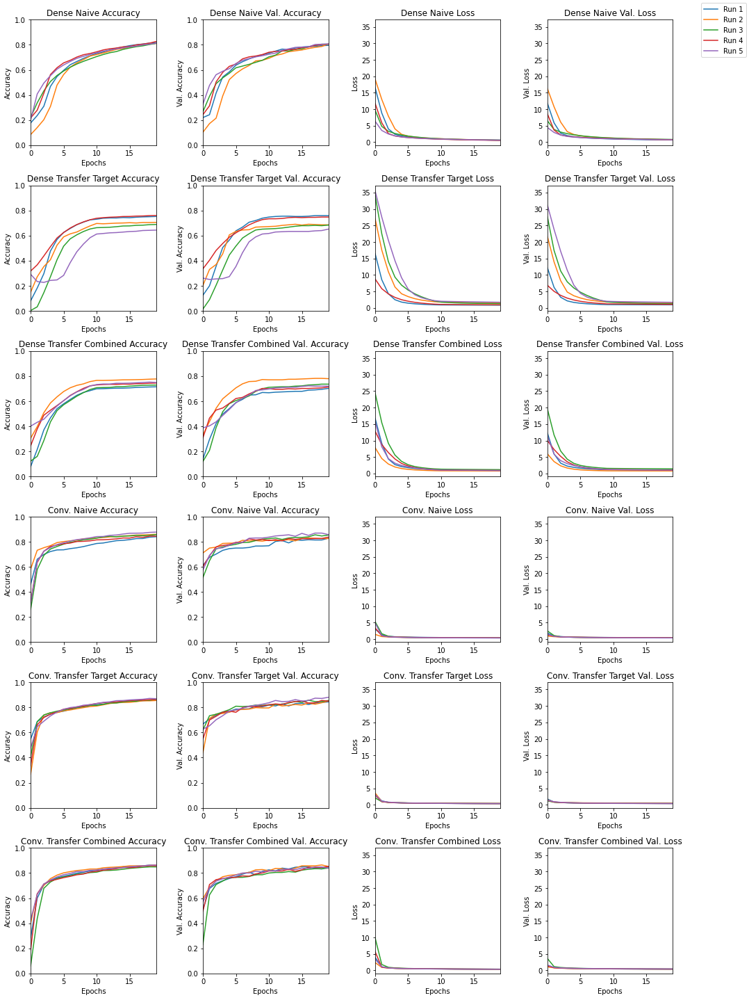

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

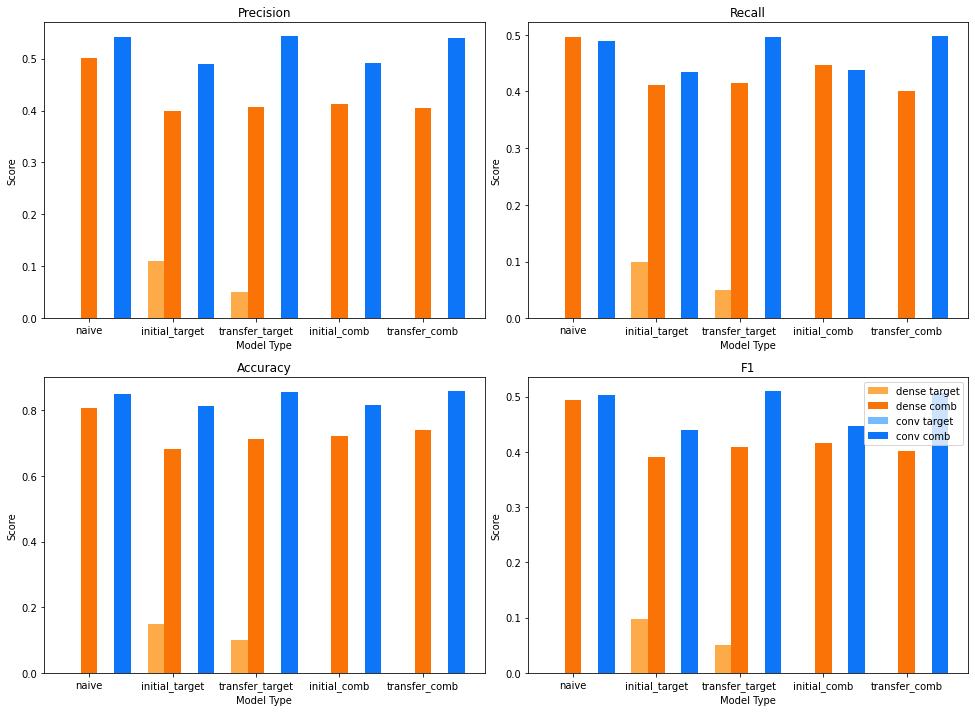

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 15 - Five-Shot Learning

Five examples per activity in target set.

### Hyperparameters

In [ ]:
exp_name = "015_five_shot"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = [x for x in range(5)]

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if i < 4 or tmp.shape[0] < 1:
                df.append(tmp)
            else:
                tmp.reset_index(drop=True, inplace=True)
                tmp = tmp.loc[keep]
                df.append(tmp)
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (10, 406)
x   (10, 405)
y   (10, 1)
x_shaped   (10, 27, 15)

val ---------------------------------------------
df   (10, 406)
x   (10, 405)
y   (10, 1)
x_shaped   (10, 27, 15)

test ---------------------------------------------
df   (10, 406)
x   (10, 405)
y   (10, 1)
x_shaped   (10, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3460, 406)
x   (3460, 405)
y   (3460, 1)
x_shaped   (3460, 27, 15

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,-0.745348,0.025975,1.622738,-0.177498,0.492810,0.748956,0.621965,-0.201309,-0.792970,0.069268,...,3.144780,6.127232,10.918991,71.795743,12.076758,9.420503,5.632002,6.602226,4.402164,1
51,0.574344,0.116168,0.480544,0.282121,0.223677,0.121940,0.024532,0.621965,0.756893,0.129155,...,3.138702,1.583315,1.629287,1.435926,2.785927,14.339952,1.332868,1.767754,1.310332,0
567,0.716487,1.207854,1.562129,0.450239,0.538989,0.790805,0.840591,0.583724,0.989949,1.052002,...,0.624273,0.159947,1.441267,3.065636,1.217022,5.290516,4.493734,1.839459,0.950692,0
1612,-0.132763,-0.328300,-1.288666,-1.296603,-0.121940,0.326135,0.564242,-1.993608,-0.649384,-0.038241,...,15.861379,68.510340,22.441009,6.250366,4.581374,7.714956,5.165075,5.297685,6.255275,1
1164,0.647219,0.718651,0.870896,1.465443,2.243260,2.009482,1.531103,0.013709,-0.187600,1.586661,...,4.091803,3.801050,5.726817,6.056255,13.798184,2.464731,8.692509,2.610989,2.189017,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.378807,0.196980,0.451682,0.285007,0.723702,0.614028,0.721538,0.616193,1.015203,0.967582,...,1.931308,1.403936,1.739083,2.020850,19.300776,5.051519,1.307955,1.581536,0.873401,0
1130,2.185537,1.093851,-0.189043,0.936556,2.212956,0.898314,0.806679,0.923568,1.134979,1.862288,...,6.294310,3.520305,2.175372,11.821230,15.477374,4.373221,7.200974,1.694572,2.608246,0
1294,0.367984,0.716487,0.689068,1.517393,-0.025254,0.929340,-0.676802,-0.115446,-0.256867,-0.195537,...,6.907540,2.007291,6.243282,3.862777,12.079109,18.057692,4.732844,6.778083,4.237873,0
860,0.730196,0.336958,0.544761,0.666701,0.652270,0.668865,0.751842,0.986342,0.640725,1.017368,...,2.400667,2.222785,1.527698,3.260122,4.705362,3.873768,1.956542,1.354238,1.652232,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
106/109 [============================>.] - ETA: 0s - loss: 27.1396 - accuracy: 0.1318
Epoch 1: val_loss improved from inf to 20.42110, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_015_five_shot/dense/naive/0/checkpoint.ckpt
109/109 [==============================] - 2s 14ms/step - loss: 27.0657 - accuracy: 0.1303 - val_loss: 20.4211 - val_accuracy: 0.1267
Epoch 2/20
 92/109 [========================>.....] - ETA: 0s - loss: 15.2588 - accuracy: 0.1328
Epoch 2: val_loss improved from 20.42110 to 10.51388, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_015_five_shot/dense/naive/0/checkpoint.ckpt
109/109 [==============================] - 0s 4ms/step - loss: 14.6446 - accuracy: 0.1390 - val_loss: 10.5139 - val_accuracy: 0.1719
Epoch 3/20
 95/109 [=========================>....] - ETA: 0s - loss: 7.82

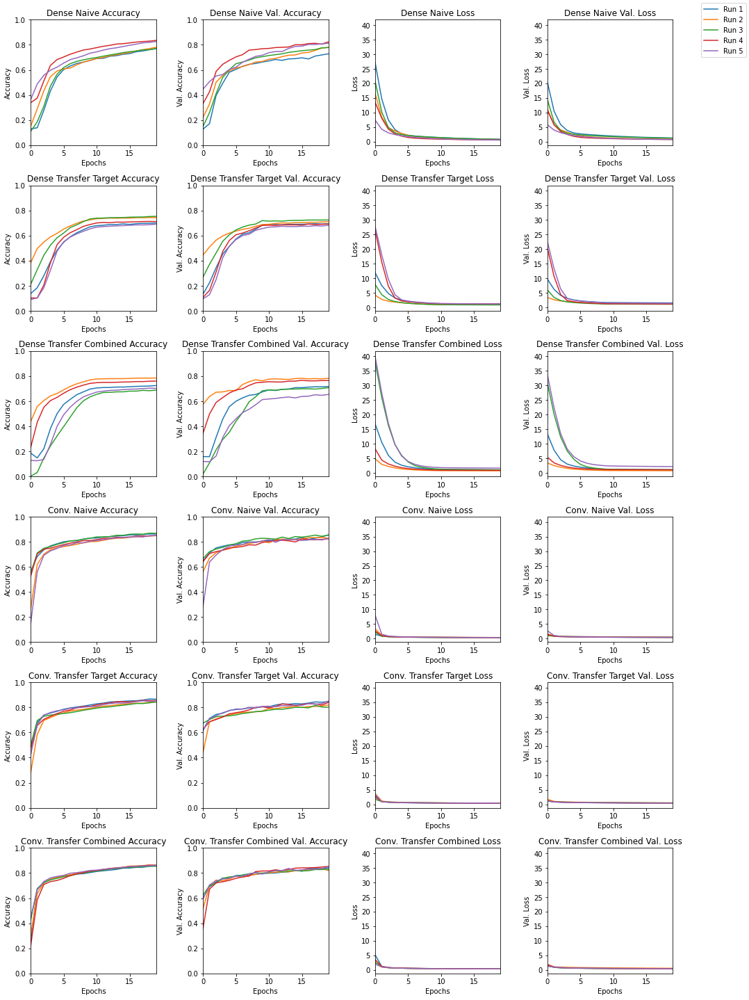

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

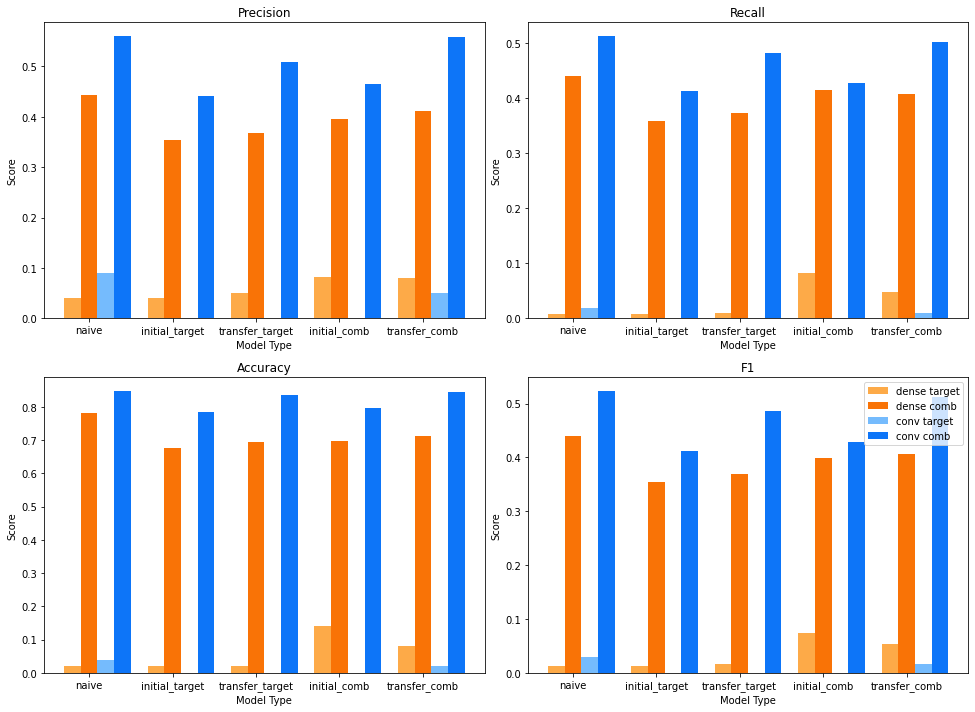

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 16 - Ten-Shot Learning

### Hyperparameters

In [ ]:
exp_name = "016_ten_shot"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = [x for x in range(10)]

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if i < 4 or tmp.shape[0] < 1:
                df.append(tmp)
            else:
                tmp.reset_index(drop=True, inplace=True)
                tmp = tmp.loc[keep]
                df.append(tmp)
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (20, 406)
x   (20, 405)
y   (20, 1)
x_shaped   (20, 27, 15)

val ---------------------------------------------
df   (20, 406)
x   (20, 405)
y   (20, 1)
x_shaped   (20, 27, 15)

test ---------------------------------------------
df   (20, 406)
x   (20, 405)
y   (20, 1)
x_shaped   (20, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3470, 406)
x   (3470, 405)
y   (3470, 1)
x_shaped   (3470, 27, 15

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,-0.745348,0.025975,1.622738,-0.177498,0.492810,0.748956,0.621965,-0.201309,-0.792970,0.069268,...,3.144780,6.127232,10.918991,71.795743,12.076758,9.420503,5.632002,6.602226,4.402164,1
51,0.574344,0.116168,0.480544,0.282121,0.223677,0.121940,0.024532,0.621965,0.756893,0.129155,...,3.138702,1.583315,1.629287,1.435926,2.785927,14.339952,1.332868,1.767754,1.310332,0
567,0.716487,1.207854,1.562129,0.450239,0.538989,0.790805,0.840591,0.583724,0.989949,1.052002,...,0.624273,0.159947,1.441267,3.065636,1.217022,5.290516,4.493734,1.839459,0.950692,0
1612,-0.132763,-0.328300,-1.288666,-1.296603,-0.121940,0.326135,0.564242,-1.993608,-0.649384,-0.038241,...,15.861379,68.510340,22.441009,6.250366,4.581374,7.714956,5.165075,5.297685,6.255275,1
1164,0.647219,0.718651,0.870896,1.465443,2.243260,2.009482,1.531103,0.013709,-0.187600,1.586661,...,4.091803,3.801050,5.726817,6.056255,13.798184,2.464731,8.692509,2.610989,2.189017,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.378807,0.196980,0.451682,0.285007,0.723702,0.614028,0.721538,0.616193,1.015203,0.967582,...,1.931308,1.403936,1.739083,2.020850,19.300776,5.051519,1.307955,1.581536,0.873401,0
1130,2.185537,1.093851,-0.189043,0.936556,2.212956,0.898314,0.806679,0.923568,1.134979,1.862288,...,6.294310,3.520305,2.175372,11.821230,15.477374,4.373221,7.200974,1.694572,2.608246,0
1294,0.367984,0.716487,0.689068,1.517393,-0.025254,0.929340,-0.676802,-0.115446,-0.256867,-0.195537,...,6.907540,2.007291,6.243282,3.862777,12.079109,18.057692,4.732844,6.778083,4.237873,0
860,0.730196,0.336958,0.544761,0.666701,0.652270,0.668865,0.751842,0.986342,0.640725,1.017368,...,2.400667,2.222785,1.527698,3.260122,4.705362,3.873768,1.956542,1.354238,1.652232,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
105/109 [===========================>..] - ETA: 0s - loss: 7.1068 - accuracy: 0.1530
Epoch 1: val_loss improved from inf to 5.65575, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_016_ten_shot/dense/naive/0/checkpoint.ckpt
109/109 [==============================] - 2s 10ms/step - loss: 7.0336 - accuracy: 0.1545 - val_loss: 5.6558 - val_accuracy: 0.1858
Epoch 2/20
107/109 [============================>.] - ETA: 0s - loss: 3.4630 - accuracy: 0.3239
Epoch 2: val_loss improved from 5.65575 to 3.79962, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_016_ten_shot/dense/naive/0/checkpoint.ckpt
109/109 [==============================] - 1s 6ms/step - loss: 3.4484 - accuracy: 0.3248 - val_loss: 3.7996 - val_accuracy: 0.3827
Epoch 3/20
108/109 [============================>.] - ETA: 0s - loss: 2.4345 - accura

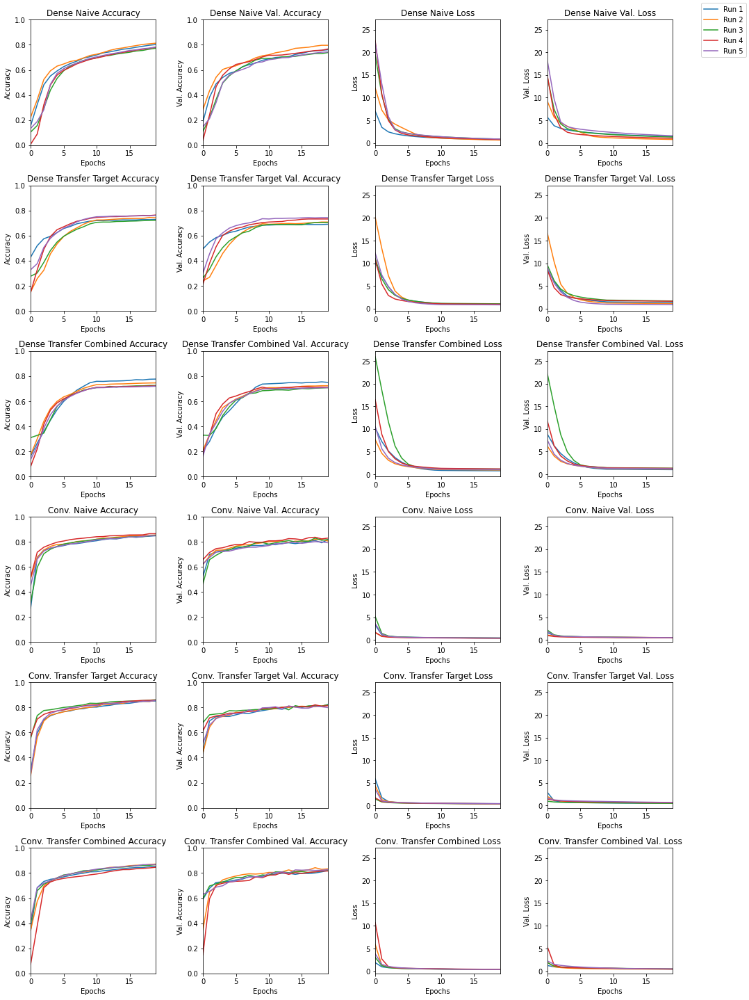

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

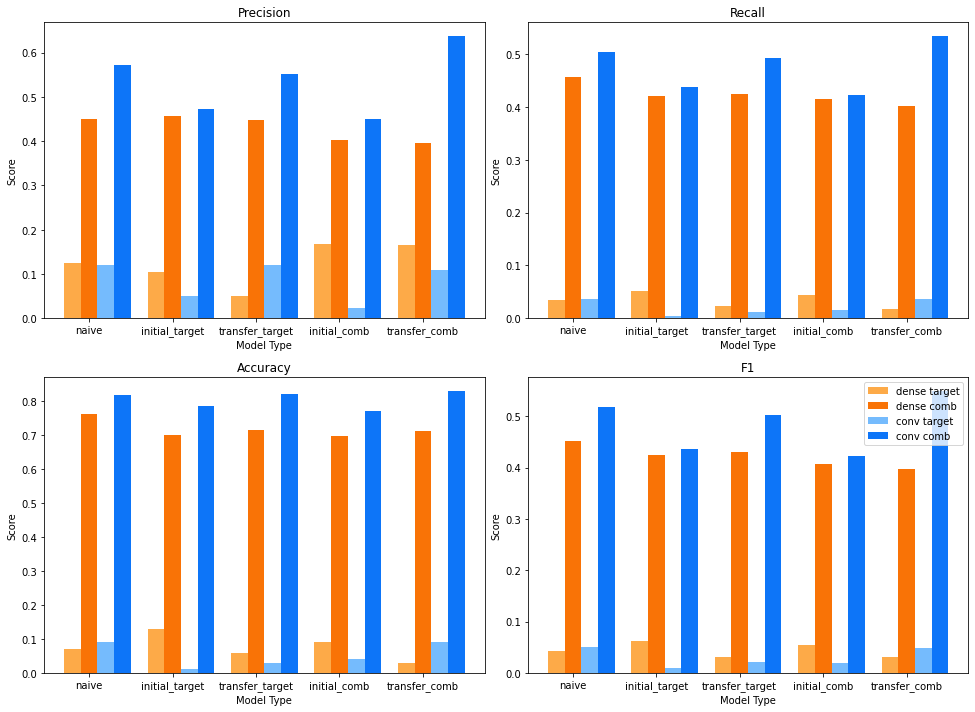

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 17 - Fifteen-Shot Learning

### Hyperparameters

In [ ]:
exp_name = "017_fifteen_shot"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = [x for x in range(15)]

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if i < 4 or tmp.shape[0] < 1:
                df.append(tmp)
            else:
                tmp.reset_index(drop=True, inplace=True)
                tmp = tmp.loc[keep]
                df.append(tmp)
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (30, 406)
x   (30, 405)
y   (30, 1)
x_shaped   (30, 27, 15)

val ---------------------------------------------
df   (30, 406)
x   (30, 405)
y   (30, 1)
x_shaped   (30, 27, 15)

test ---------------------------------------------
df   (30, 406)
x   (30, 405)
y   (30, 1)
x_shaped   (30, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3480, 406)
x   (3480, 405)
y   (3480, 1)
x_shaped   (3480, 27, 15

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,-0.745348,0.025975,1.622738,-0.177498,0.492810,0.748956,0.621965,-0.201309,-0.792970,0.069268,...,3.144780,6.127232,10.918991,71.795743,12.076758,9.420503,5.632002,6.602226,4.402164,1
51,0.574344,0.116168,0.480544,0.282121,0.223677,0.121940,0.024532,0.621965,0.756893,0.129155,...,3.138702,1.583315,1.629287,1.435926,2.785927,14.339952,1.332868,1.767754,1.310332,0
567,0.716487,1.207854,1.562129,0.450239,0.538989,0.790805,0.840591,0.583724,0.989949,1.052002,...,0.624273,0.159947,1.441267,3.065636,1.217022,5.290516,4.493734,1.839459,0.950692,0
1612,-0.132763,-0.328300,-1.288666,-1.296603,-0.121940,0.326135,0.564242,-1.993608,-0.649384,-0.038241,...,15.861379,68.510340,22.441009,6.250366,4.581374,7.714956,5.165075,5.297685,6.255275,1
1164,0.647219,0.718651,0.870896,1.465443,2.243260,2.009482,1.531103,0.013709,-0.187600,1.586661,...,4.091803,3.801050,5.726817,6.056255,13.798184,2.464731,8.692509,2.610989,2.189017,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.378807,0.196980,0.451682,0.285007,0.723702,0.614028,0.721538,0.616193,1.015203,0.967582,...,1.931308,1.403936,1.739083,2.020850,19.300776,5.051519,1.307955,1.581536,0.873401,0
1130,2.185537,1.093851,-0.189043,0.936556,2.212956,0.898314,0.806679,0.923568,1.134979,1.862288,...,6.294310,3.520305,2.175372,11.821230,15.477374,4.373221,7.200974,1.694572,2.608246,0
1294,0.367984,0.716487,0.689068,1.517393,-0.025254,0.929340,-0.676802,-0.115446,-0.256867,-0.195537,...,6.907540,2.007291,6.243282,3.862777,12.079109,18.057692,4.732844,6.778083,4.237873,0
860,0.730196,0.336958,0.544761,0.666701,0.652270,0.668865,0.751842,0.986342,0.640725,1.017368,...,2.400667,2.222785,1.527698,3.260122,4.705362,3.873768,1.956542,1.354238,1.652232,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
 95/109 [=========================>....] - ETA: 0s - loss: 10.3736 - accuracy: 0.3007
Epoch 1: val_loss improved from inf to 7.70239, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_017_fifteen_shot/dense/naive/0/checkpoint.ckpt
109/109 [==============================] - 2s 11ms/step - loss: 10.0611 - accuracy: 0.3014 - val_loss: 7.7024 - val_accuracy: 0.3139
Epoch 2/20
 99/109 [==========================>...] - ETA: 0s - loss: 6.1694 - accuracy: 0.4018
Epoch 2: val_loss improved from 7.70239 to 5.21420, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_017_fifteen_shot/dense/naive/0/checkpoint.ckpt
109/109 [==============================] - 0s 4ms/step - loss: 6.0572 - accuracy: 0.4086 - val_loss: 5.2142 - val_accuracy: 0.4437
Epoch 3/20
 96/109 [=========================>....] - ETA: 0s - loss: 4.232

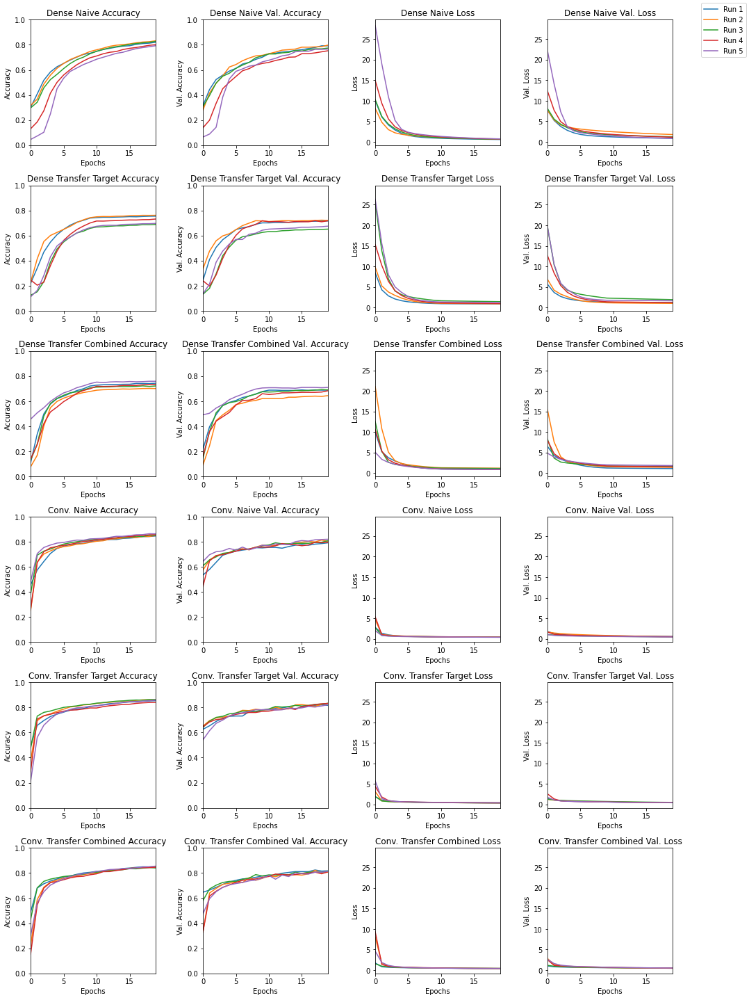

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

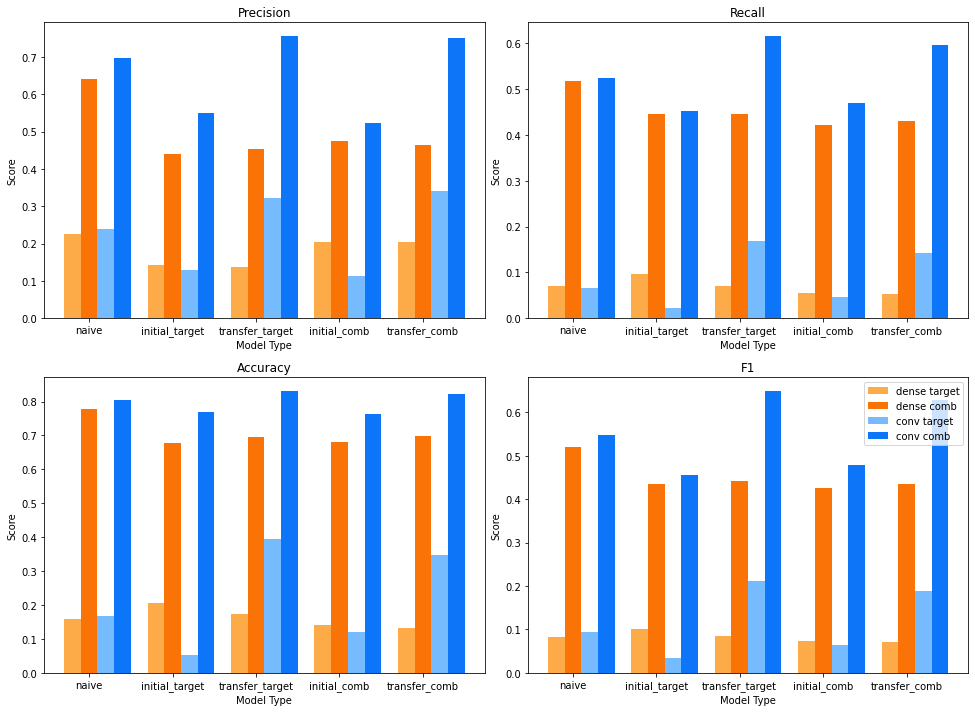

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

## Experiment 18 - Twenty-Shot Learning

### Hyperparameters

In [ ]:
exp_name = "018_twenty_shot"

# File handling
exp_checkpoint_path = checkpoint_path + exp_name + "/"

# Data
keep = [x for x in range(20)]

# Training
learning_rate = 0.00001
dense_train_layers = 1
conv_train_layers = 2
drop = True

### Select Data

In [ ]:
data_new = {}
for k1 in data.keys():
    data_new.update({k1: {}})
    for k2 in data[k1].keys():
        data_new[k1].update({k2: {}})
        df = []
        for i in range(n_labels):
            tmp = data[k1][k2]["df"].loc[data[k1][k2]["df"]["label"] == i]
            if i < 4 or tmp.shape[0] < 1:
                df.append(tmp)
            else:
                tmp.reset_index(drop=True, inplace=True)
                tmp = tmp.loc[keep]
                df.append(tmp)
        df = pd.concat(df, axis=0, ignore_index=True)
        df = df.sample(frac=1, random_state=42)
        data_new[k1][k2] = split_x_y(df, img_rows, img_cols)

view_data_shapes(data_new)
data_new["source"]["train"]["df"]

source =============================================
train ---------------------------------------------
df   (3450, 406)
x   (3450, 405)
y   (3450, 1)
x_shaped   (3450, 27, 15)

val ---------------------------------------------
df   (432, 406)
x   (432, 405)
y   (432, 1)
x_shaped   (432, 27, 15)

test ---------------------------------------------
df   (430, 406)
x   (430, 405)
y   (430, 1)
x_shaped   (430, 27, 15)


target =============================================
train ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

val ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)

test ---------------------------------------------
df   (40, 406)
x   (40, 405)
y   (40, 1)
x_shaped   (40, 27, 15)


comb =============================================
train ---------------------------------------------
df   (3490, 406)
x   (3490, 405)
y   (3490, 1)
x_shaped   (3490, 27, 15

,0,1,2,3,4,5,6,7,8,9,...,396,397,398,399,400,401,402,403,404,label
1451,-0.745348,0.025975,1.622738,-0.177498,0.492810,0.748956,0.621965,-0.201309,-0.792970,0.069268,...,3.144780,6.127232,10.918991,71.795743,12.076758,9.420503,5.632002,6.602226,4.402164,1
51,0.574344,0.116168,0.480544,0.282121,0.223677,0.121940,0.024532,0.621965,0.756893,0.129155,...,3.138702,1.583315,1.629287,1.435926,2.785927,14.339952,1.332868,1.767754,1.310332,0
567,0.716487,1.207854,1.562129,0.450239,0.538989,0.790805,0.840591,0.583724,0.989949,1.052002,...,0.624273,0.159947,1.441267,3.065636,1.217022,5.290516,4.493734,1.839459,0.950692,0
1612,-0.132763,-0.328300,-1.288666,-1.296603,-0.121940,0.326135,0.564242,-1.993608,-0.649384,-0.038241,...,15.861379,68.510340,22.441009,6.250366,4.581374,7.714956,5.165075,5.297685,6.255275,1
1164,0.647219,0.718651,0.870896,1.465443,2.243260,2.009482,1.531103,0.013709,-0.187600,1.586661,...,4.091803,3.801050,5.726817,6.056255,13.798184,2.464731,8.692509,2.610989,2.189017,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.378807,0.196980,0.451682,0.285007,0.723702,0.614028,0.721538,0.616193,1.015203,0.967582,...,1.931308,1.403936,1.739083,2.020850,19.300776,5.051519,1.307955,1.581536,0.873401,0
1130,2.185537,1.093851,-0.189043,0.936556,2.212956,0.898314,0.806679,0.923568,1.134979,1.862288,...,6.294310,3.520305,2.175372,11.821230,15.477374,4.373221,7.200974,1.694572,2.608246,0
1294,0.367984,0.716487,0.689068,1.517393,-0.025254,0.929340,-0.676802,-0.115446,-0.256867,-0.195537,...,6.907540,2.007291,6.243282,3.862777,12.079109,18.057692,4.732844,6.778083,4.237873,0
860,0.730196,0.336958,0.544761,0.666701,0.652270,0.668865,0.751842,0.986342,0.640725,1.017368,...,2.400667,2.222785,1.527698,3.260122,4.705362,3.873768,1.956542,1.354238,1.652232,0


### Run Experiment



Run 0, dense, naive ===============================================================
Epoch 1/20
106/110 [===========================>..] - ETA: 0s - loss: 12.6054 - accuracy: 0.3196
Epoch 1: val_loss improved from inf to 9.06369, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_018_twenty_shot/dense/naive/0/checkpoint.ckpt
110/110 [==============================] - 1s 9ms/step - loss: 12.4876 - accuracy: 0.3221 - val_loss: 9.0637 - val_accuracy: 0.3941
Epoch 2/20
109/110 [============================>.] - ETA: 0s - loss: 6.9896 - accuracy: 0.4811
Epoch 2: val_loss improved from 9.06369 to 6.02113, saving model to /content/drive/MyDrive/AI in healthcare and Wearables/Results/checkpoints/exp_018_twenty_shot/dense/naive/0/checkpoint.ckpt
110/110 [==============================] - 1s 5ms/step - loss: 6.9916 - accuracy: 0.4811 - val_loss: 6.0211 - val_accuracy: 0.4873
Epoch 3/20
105/110 [===========================>..] - ETA: 0s - loss: 4.7751 -

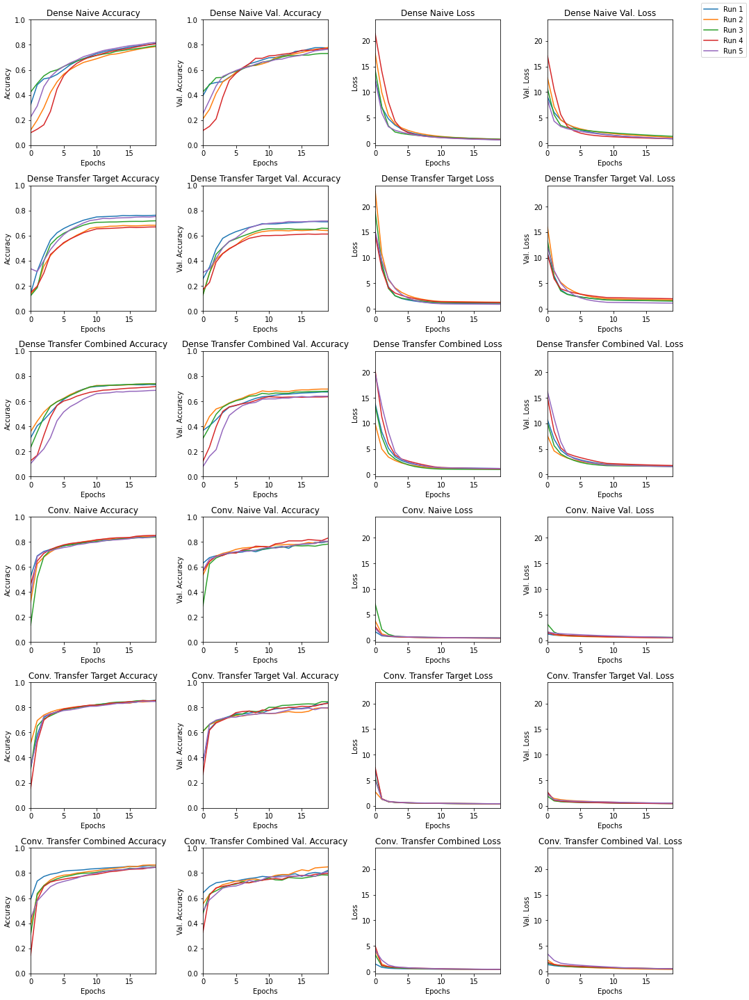

In [ ]:
dual_handler = DualModelArchetypeHandler(exp_name, lables_to_values_map, save_dir=save_dir, 
                                         checkpoint_path=exp_checkpoint_path, checkpoint_file_name=cp_file
                                         )
dual_handler.run_experiment(input_shape_dense, input_shape_conv, 
                            dense_train_layers, conv_train_layers, 
                            data=data_new, n_labels=n_labels, learning_rate=learning_rate, drop=drop, 
                            epochs=epochs, n_runs=n_runs, 
                            verbose=False
                            )
tracker_global.update({exp_name: dual_handler.dual_tracker})
plot_histories(dual_handler, n_runs, epochs, save=True, save_dir=hist_plot_dir, save_name="%s_hist.png"%(exp_name))

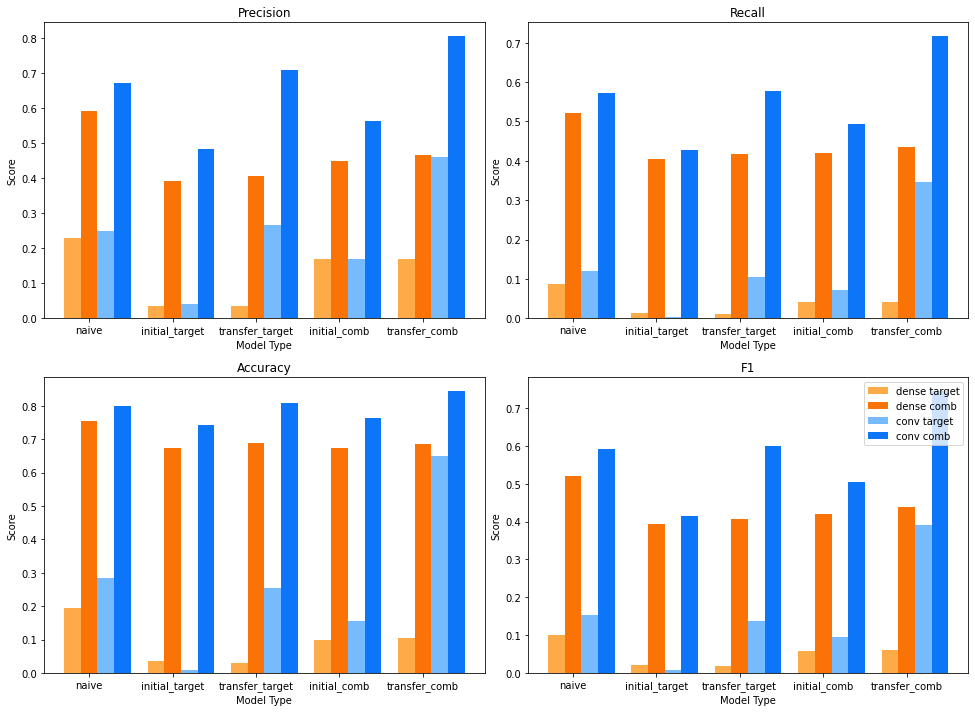

In [ ]:
plot_scores(tracker_global[exp_name], save=True, save_dir=tracker_bar_dir, save_name="%s_bar.png"%(exp_name))

# Bottom